### Import libraries and set options

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from PIL import Image
import os
import shutil
import tensorflow as tf
from tensorflow import keras

In [2]:
pd.set_option('display.max_columns', None)

# Calcifications Case Descriptions

### Read in CSV files

In [3]:
calc_case_description_1 = pd.read_csv('../data/raw/csv/calc_case_description_train_set.csv')
calc_case_description_1['training_set'] = 1
calc_case_description_2 = pd.read_csv('../data/raw/csv/calc_case_description_test_set.csv')
calc_case_description_2['training_set'] = 0
calc_case_description = pd.concat([calc_case_description_1, calc_case_description_2]).reset_index(drop=True)

### View Data

In [4]:
calc_case_description.head()

,patient_id,breast density,left or right breast,image view,abnormality id,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path,training_set
0,P_00005,3,RIGHT,CC,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_CC/1.3.6.1.4.1.959...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...,1
1,P_00005,3,RIGHT,MLO,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_MLO/1.3.6.1.4.1.95...,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....,1
2,P_00007,4,LEFT,CC,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...,1
3,P_00007,4,LEFT,MLO,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_MLO/1.3.6.1.4.1.959...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...,1
4,P_00008,1,LEFT,CC,1,calcification,NaN,REGIONAL,2,BENIGN_WITHOUT_CALLBACK,3,Calc-Training_P_00008_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...,1


### Fix Datatypes

In [5]:
calc_case_description.dtypes

patient_id                 object
breast density              int64
left or right breast       object
image view                 object
abnormality id              int64
abnormality type           object
calc type                  object
calc distribution          object
assessment                  int64
pathology                  object
subtlety                    int64
image file path            object
cropped image file path    object
ROI mask file path         object
training_set                int64
dtype: object

In [6]:
def set_as_object(df, col):
    return df[col].astype(object)
for col in ['breast density', 'abnormality id', 'assessment', 'subtlety']:
    calc_case_description[col] = set_as_object(calc_case_description, col)

In [7]:
calc_case_description.dtypes

patient_id                 object
breast density             object
left or right breast       object
image view                 object
abnormality id             object
abnormality type           object
calc type                  object
calc distribution          object
assessment                 object
pathology                  object
subtlety                   object
image file path            object
cropped image file path    object
ROI mask file path         object
training_set                int64
dtype: object

### Profiling Report

In [8]:
calc_case_description_profile_report = calc_case_description.copy()

#### See Breast Cancer Calcifications - Profiling Report (near bottom of notebook)

A few observations can be made from the profiling report:

-More calcifications occur in the left breast than the right breast. 

-Abnormality id is positively skewed.

-Calc type and calc distribution are missing values.

-Most of the cases are benign (and there are two types of bengin: benign and benign without callback)

-Abnormality id, Calc type, calc distribution, and assessment are all correlated with pathology.

### Fill In Missing Values

In [9]:
calc_case_description = calc_case_description.fillna('Unknown')

### Create Target Feature

In [10]:
calc_case_description['malignant'] = [1 if x == 'MALIGNANT' else 0 for x in calc_case_description.pathology]

### Numerical Features

#### View Summary Statistics

In [11]:
calc_case_description[['breast density', 'abnormality id', 'assessment', 'subtlety', 'malignant']].describe()

,breast density,abnormality id,assessment,subtlety,malignant
count,1872.000000,1872.000000,1872.000000,1872.000000,1872.000000
mean,2.669338,1.380342,3.292735,3.395299,0.359509
std,0.932322,0.853576,1.224108,1.181426,0.479985
min,0.000000,1.000000,0.000000,1.000000,0.000000
25%,2.000000,1.000000,2.000000,3.000000,0.000000
50%,3.000000,1.000000,4.000000,3.000000,0.000000
75%,3.000000,1.000000,4.000000,4.000000,1.000000
max,4.000000,7.000000,5.000000,5.000000,1.000000


#### Barplots of Averages by "malignant"

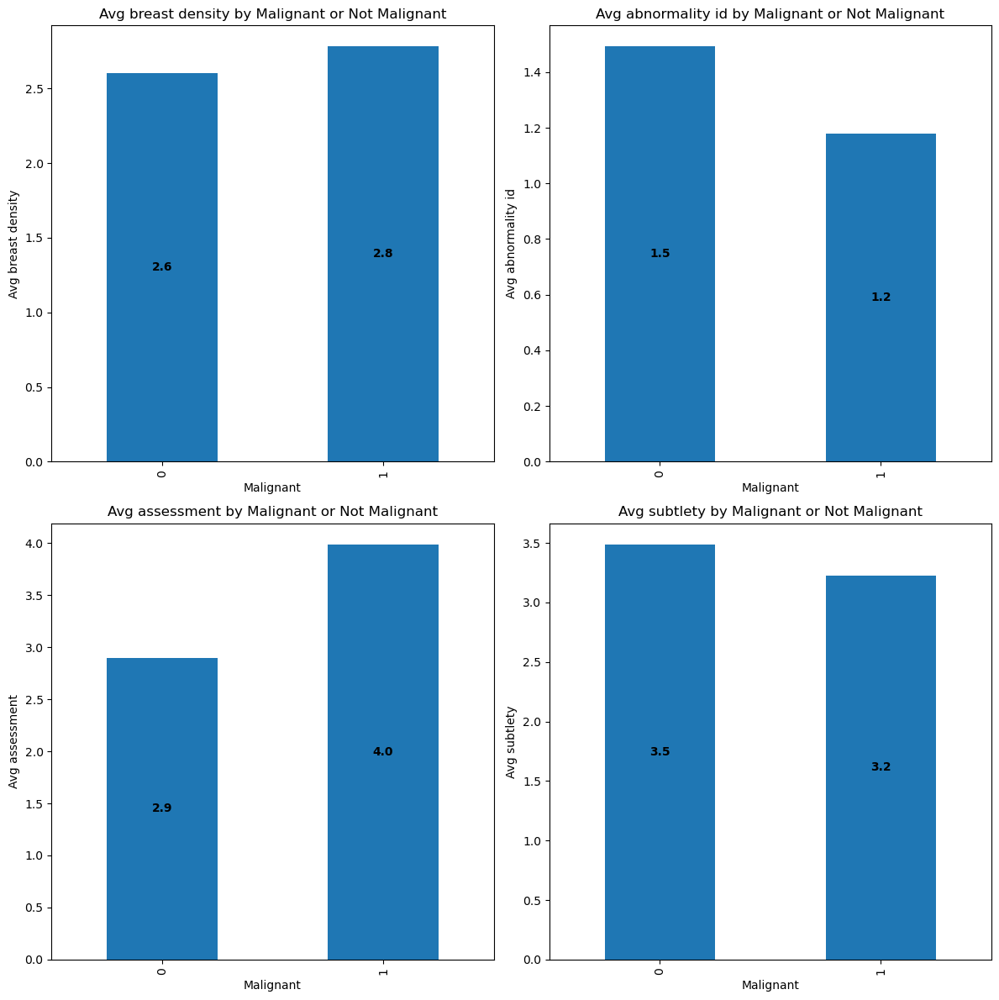

In [12]:
def get_avg_by_malignant(df, columns):
    plt.figure(figsize=(12, 12))
    for i, col in enumerate(columns, start=1):
        plt.subplot(2, 2, i)
        means = pd.DataFrame(df.groupby('malignant')[col].mean().reset_index())
        ax = means.plot(x='malignant', y=col, kind='bar', ax=plt.gca(), legend=False)
        plt.title(f'Avg {col} by Malignant or Not Malignant')
        plt.xlabel('Malignant')
        plt.ylabel(f'Avg {col}')
        for p in ax.patches:
            width, height = p.get_width(), p.get_height()
            x, y = p.get_xy()
            ax.annotate(f'{height:.1f}', (x + width/2, y + height/2), ha='center', va='center', fontweight='bold')
    plt.tight_layout()
    
columns = ['breast density', 'abnormality id', 'assessment', 'subtlety']
get_avg_by_malignant(calc_case_description, columns)

Observations about the numerical features:
    
-Average breast density is slightly larger for malignant cases than benign ones and assessment is about 40% greater.

-Average abnormality id and subtlety are slightly larger for benign cases than malignant ones.

### Categorical Columns

#### Stacked Barplots by "malignant"

<Figure size 1200x600 with 0 Axes>

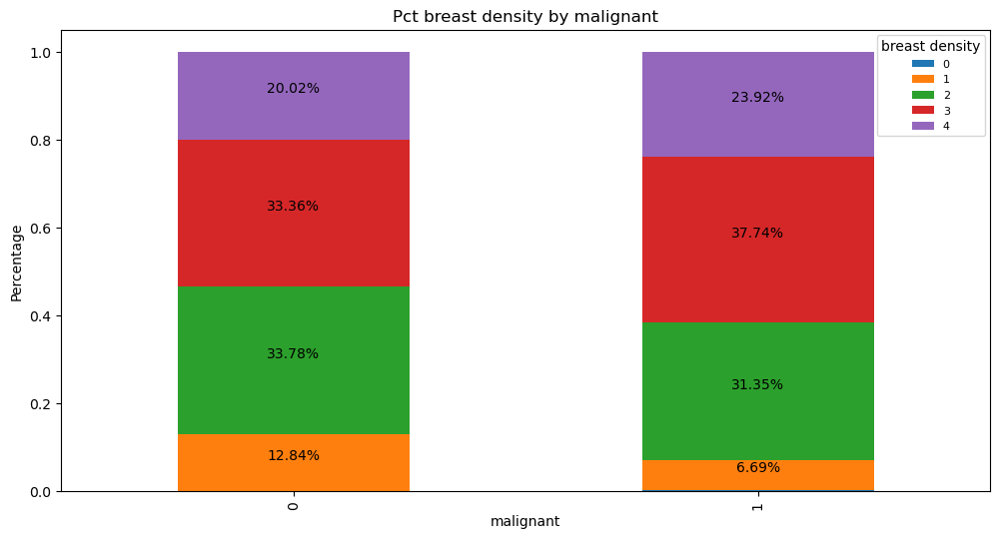

<Figure size 1200x600 with 0 Axes>

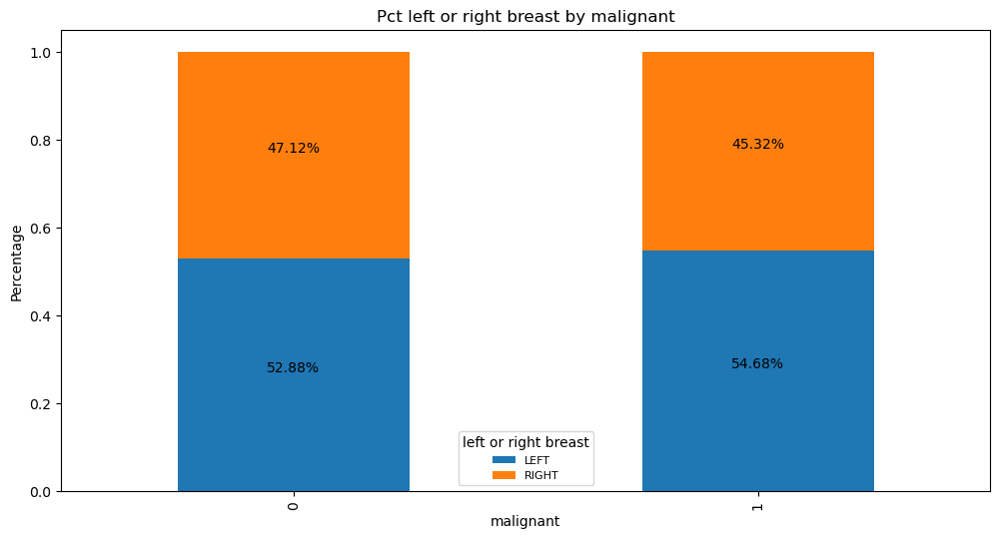

<Figure size 1200x600 with 0 Axes>

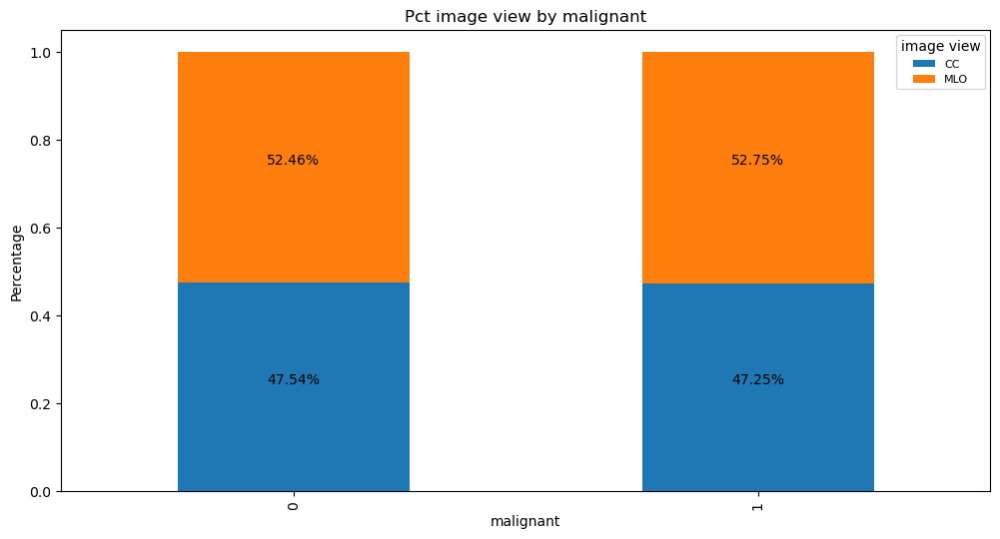

<Figure size 1200x600 with 0 Axes>

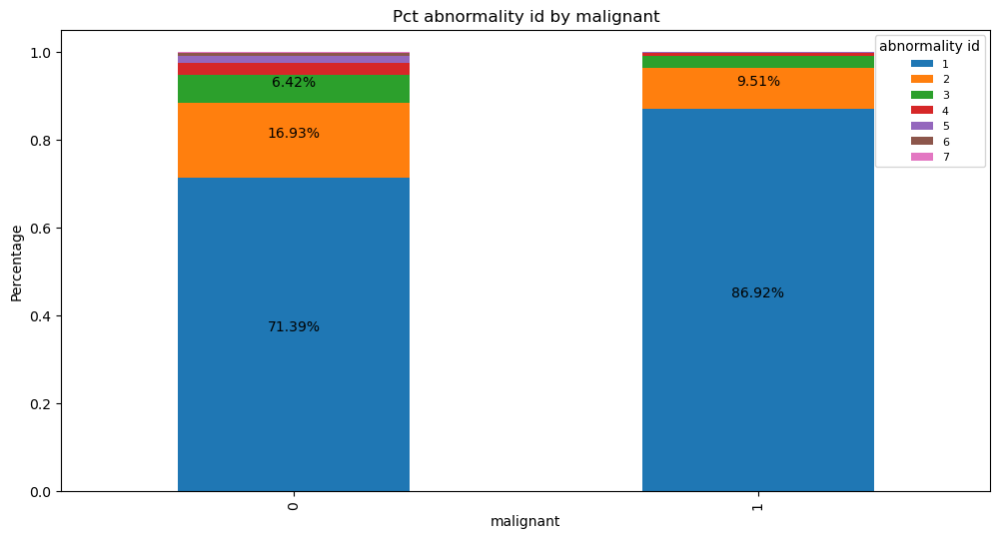

<Figure size 1200x600 with 0 Axes>

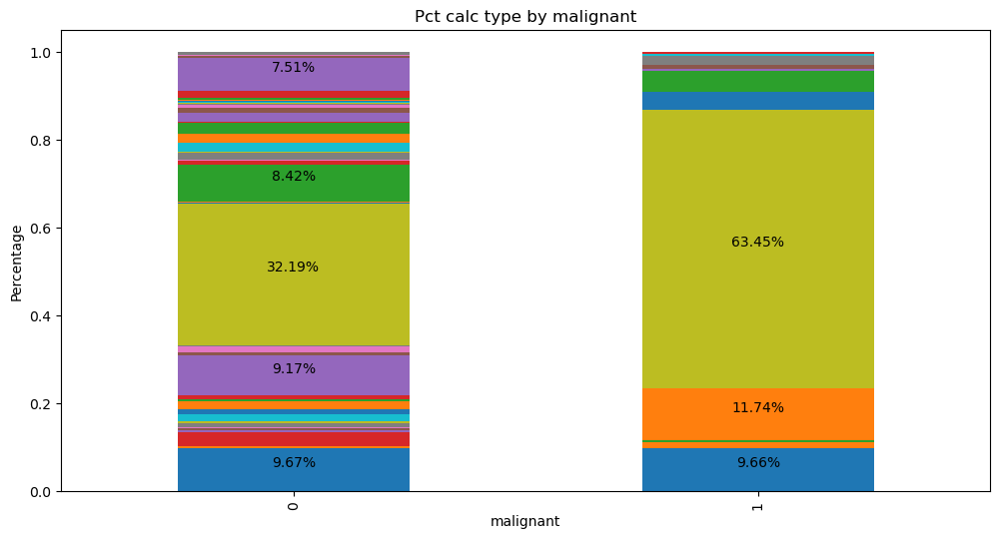

<Figure size 1200x600 with 0 Axes>

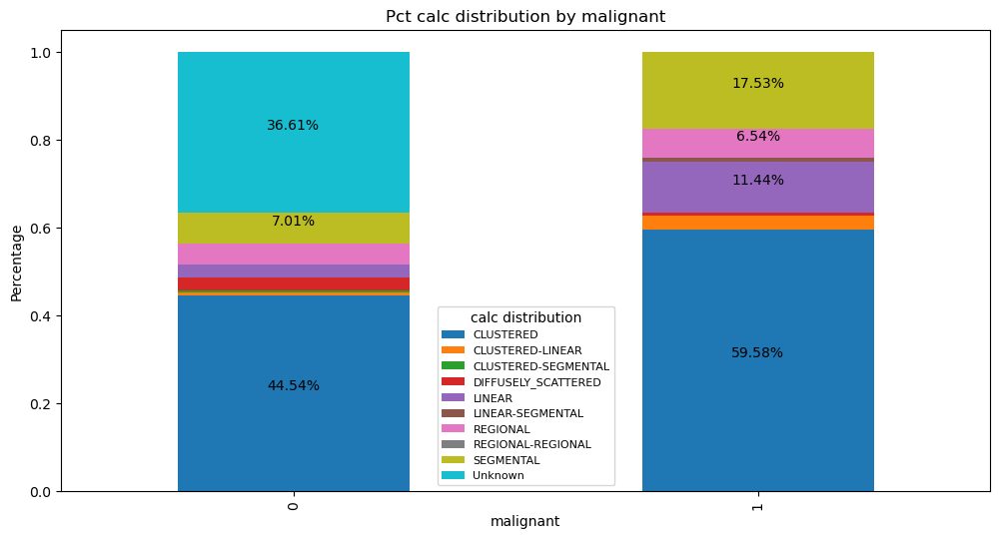

<Figure size 1200x600 with 0 Axes>

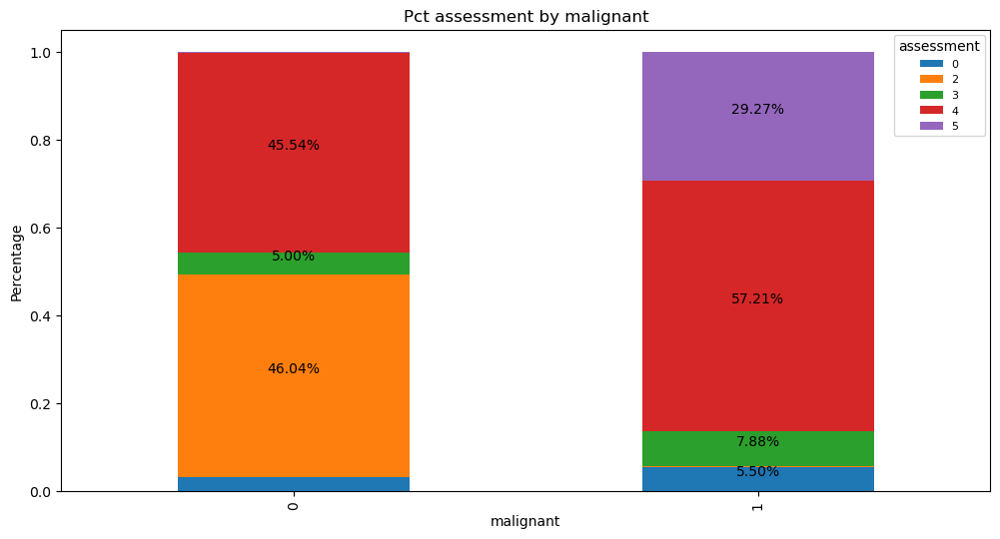

<Figure size 1200x600 with 0 Axes>

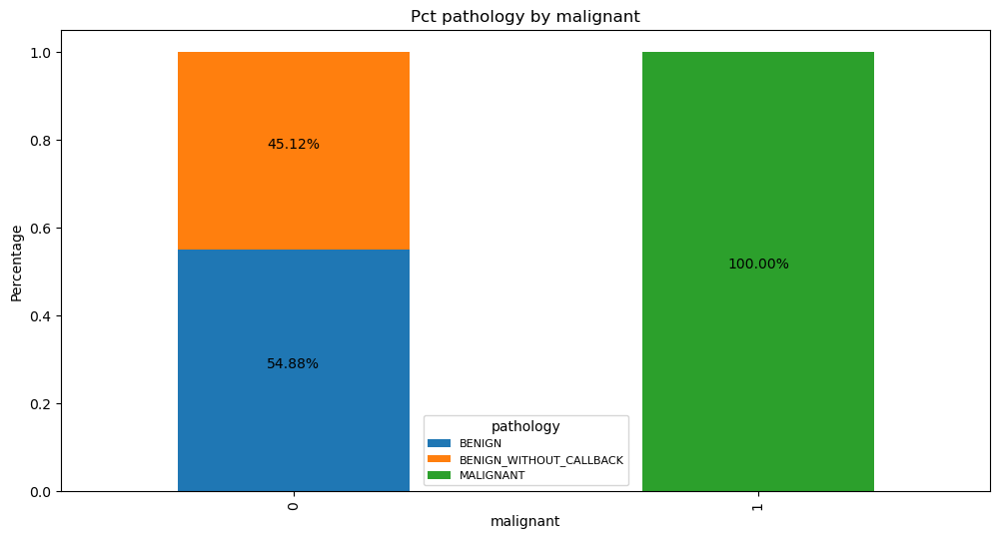

<Figure size 1200x600 with 0 Axes>

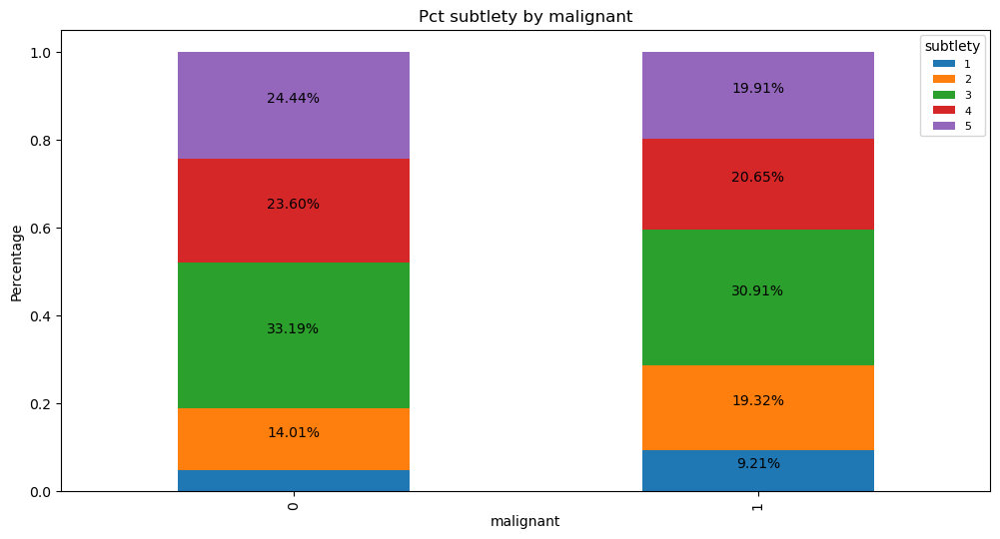

In [13]:
def get_pcts_by_malignant(df, var):
    _ = plt.figure(figsize=(12, 6))
    df = df.groupby('malignant')[var].value_counts(normalize=True).unstack()
    if len(df.columns) <= 10:
        ax = df.plot(kind='bar', stacked=True, figsize=(12, 6))
    else:
        ax = df.plot(kind='bar', stacked=True, figsize=(12, 6), legend=False)
        
    _ = plt.xlabel('malignant')
    _ = plt.ylabel('Percentage')
    _ = plt.title(f'Pct {var} by malignant')
    
    if len(df.columns) <= 10:
        _ = plt.legend(title=var, fontsize=8)
        
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if height > .05:
            _ = ax.annotate(f'{height:.2%}', (x + width/2, y + height / 2), ha='center', va='bottom')

for var in calc_case_description.columns.drop(['patient_id', 'abnormality type', 'image file path', 'cropped image file path', 
                                               'ROI mask file path', 'training_set', 'malignant']):
    get_pcts_by_malignant(calc_case_description, var)

Observations about the categorical features:

-The distribution of calc types is different between benign and malignant cases.

-The distribution of calc distribution is different between benign and malignant cases with a lot of the benign cases falling into the unknown bucket.

-The distribution of assessment is different between benign and malignant cases.

# Mass Case Descriptions

### Read in CSV files

In [14]:
mass_case_description_1 = pd.read_csv('../data/raw/csv/mass_case_description_train_set.csv')
mass_case_description_1['training_set'] = 1
mass_case_description_2 = pd.read_csv('../data/raw/csv/mass_case_description_test_set.csv')
mass_case_description_2['training_set'] = 0
mass_case_description = pd.concat([mass_case_description_1, mass_case_description_2]).reset_index(drop=True)

### View Data

In [15]:
mass_case_description.head()

,patient_id,breast_density,left or right breast,image view,abnormality id,abnormality type,mass shape,mass margins,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path,training_set
0,P_00001,3,LEFT,CC,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Mass-Training_P_00001_LEFT_CC/1.3.6.1.4.1.9590...,Mass-Training_P_00001_LEFT_CC_1/1.3.6.1.4.1.95...,Mass-Training_P_00001_LEFT_CC_1/1.3.6.1.4.1.95...,1
1,P_00001,3,LEFT,MLO,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Mass-Training_P_00001_LEFT_MLO/1.3.6.1.4.1.959...,Mass-Training_P_00001_LEFT_MLO_1/1.3.6.1.4.1.9...,Mass-Training_P_00001_LEFT_MLO_1/1.3.6.1.4.1.9...,1
2,P_00004,3,LEFT,CC,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Mass-Training_P_00004_LEFT_CC/1.3.6.1.4.1.9590...,Mass-Training_P_00004_LEFT_CC_1/1.3.6.1.4.1.95...,Mass-Training_P_00004_LEFT_CC_1/1.3.6.1.4.1.95...,1
3,P_00004,3,LEFT,MLO,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Mass-Training_P_00004_LEFT_MLO/1.3.6.1.4.1.959...,Mass-Training_P_00004_LEFT_MLO_1/1.3.6.1.4.1.9...,Mass-Training_P_00004_LEFT_MLO_1/1.3.6.1.4.1.9...,1
4,P_00004,3,RIGHT,MLO,1,mass,OVAL,CIRCUMSCRIBED,4,BENIGN,5,Mass-Training_P_00004_RIGHT_MLO/1.3.6.1.4.1.95...,Mass-Training_P_00004_RIGHT_MLO_1/1.3.6.1.4.1....,Mass-Training_P_00004_RIGHT_MLO_1/1.3.6.1.4.1....,1


### Fix Datatypes

In [16]:
mass_case_description.dtypes

patient_id                 object
breast_density              int64
left or right breast       object
image view                 object
abnormality id              int64
abnormality type           object
mass shape                 object
mass margins               object
assessment                  int64
pathology                  object
subtlety                    int64
image file path            object
cropped image file path    object
ROI mask file path         object
training_set                int64
dtype: object

In [17]:
mass_case_description = mass_case_description.rename({'breast_density': 'breast density'}, axis=1)
for col in ['breast density', 'abnormality id', 'assessment', 'subtlety']:
    mass_case_description[col] = set_as_object(mass_case_description, col)

In [18]:
mass_case_description.dtypes

patient_id                 object
breast density             object
left or right breast       object
image view                 object
abnormality id             object
abnormality type           object
mass shape                 object
mass margins               object
assessment                 object
pathology                  object
subtlety                   object
image file path            object
cropped image file path    object
ROI mask file path         object
training_set                int64
dtype: object

### Profiling Report

In [19]:
mass_case_description_profile_report = mass_case_description.copy()

#### See Breast Cancer Masses - Profiling Report (near bottom of notebook)

A few observations can be made from the profiling report:

-More masses occur in the right breast than the left.

-Abnormality id is positively skewed.

-Mass margins is missing data.

-The difference between the number of benign and malignant masses is smaller than the difference in calcifications.

-Subtlety is negatively skewed.

-Assessment, mass shape, and mass margins are correlated with pathology.

### Create Target Feature

In [20]:
mass_case_description['malignant'] = [1 if x == 'MALIGNANT' else 0 for x in mass_case_description.pathology]

### Numerical Features

#### View Summary Statistics

In [21]:
mass_case_description[['breast density', 'abnormality id', 'assessment', 'subtlety', 'malignant']].describe()

,malignant
count,1696.000000
mean,0.462264
std,0.498721
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


#### Barplots of Averages by "malignant"

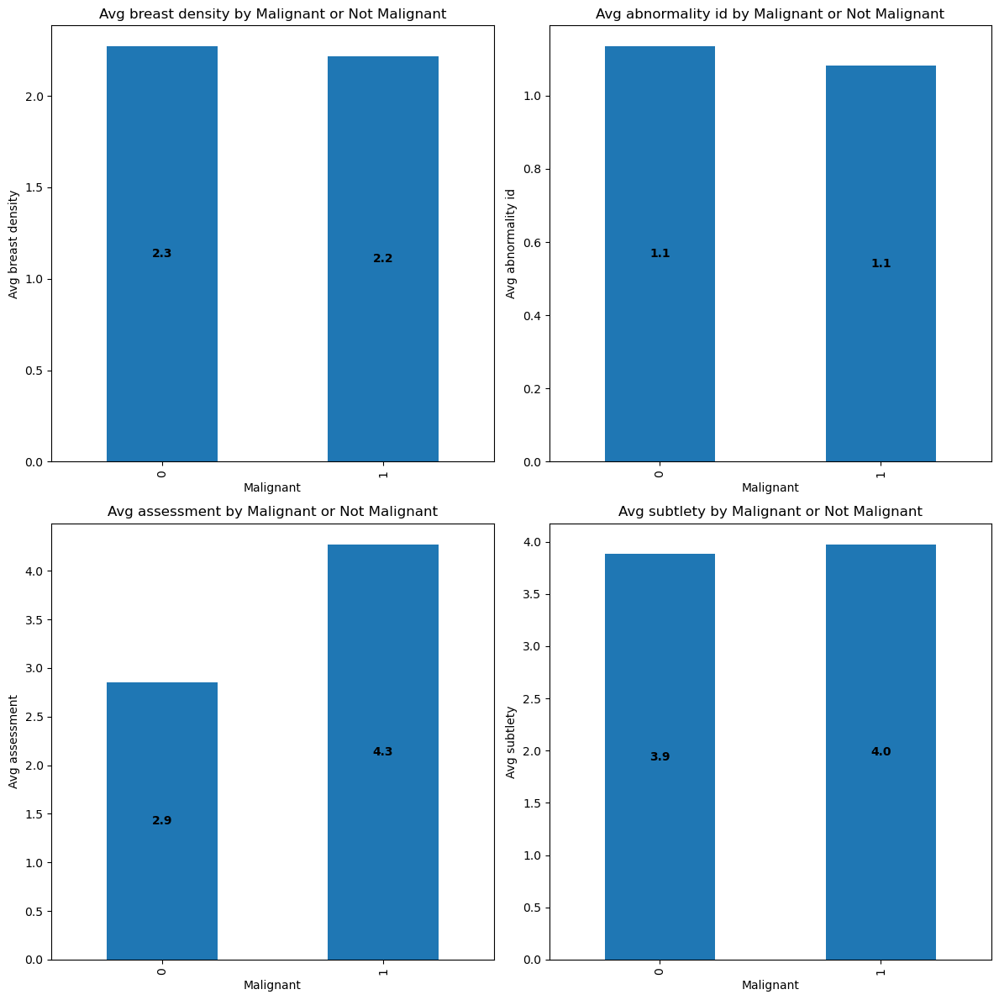

In [22]:
def get_avg_by_malignant(df, columns):
    plt.figure(figsize=(12, 12))
    for i, col in enumerate(columns, start=1):
        plt.subplot(2, 2, i)
        means = pd.DataFrame(df.groupby('malignant')[col].mean().reset_index())
        ax = means.plot(x='malignant', y=col, kind='bar', ax=plt.gca(), legend=False)
        plt.title(f'Avg {col} by Malignant or Not Malignant')
        plt.xlabel('Malignant')
        plt.ylabel(f'Avg {col}')
        for p in ax.patches:
            width, height = p.get_width(), p.get_height()
            x, y = p.get_xy()
            ax.annotate(f'{height:.1f}', (x + width/2, y + height/2), ha='center', va='center', fontweight='bold')
    plt.tight_layout()
    
columns = ['breast density', 'abnormality id', 'assessment', 'subtlety']
get_avg_by_malignant(mass_case_description, columns)

Observations about the numerical features:

-Average breast density, abnormality id, and subtlety are all roughly the same between benign and malignant cases.

-Average assessment is about 50% larger is malignant cases than benign ones.

### Categorical Columns

#### Stacked Barplots by "malignant"

<Figure size 1200x600 with 0 Axes>

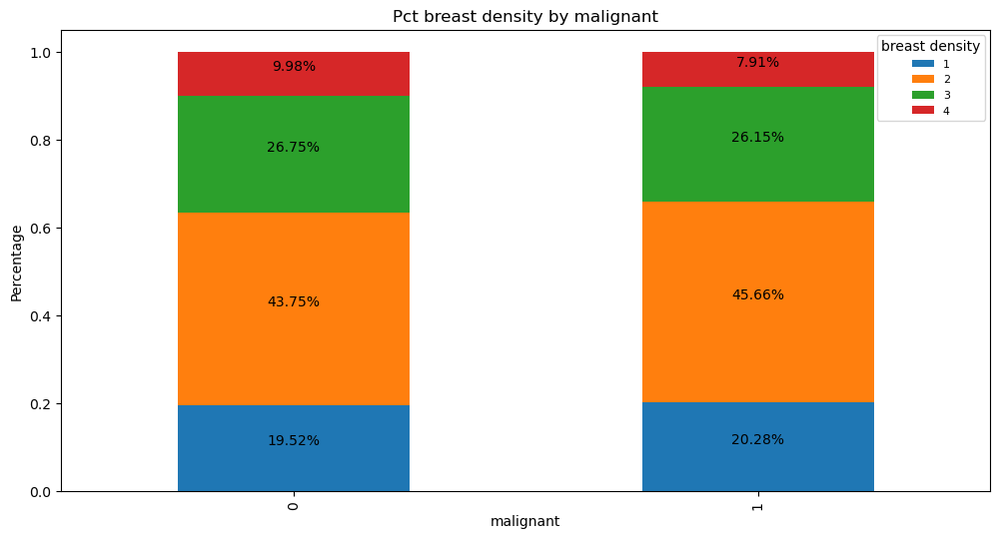

<Figure size 1200x600 with 0 Axes>

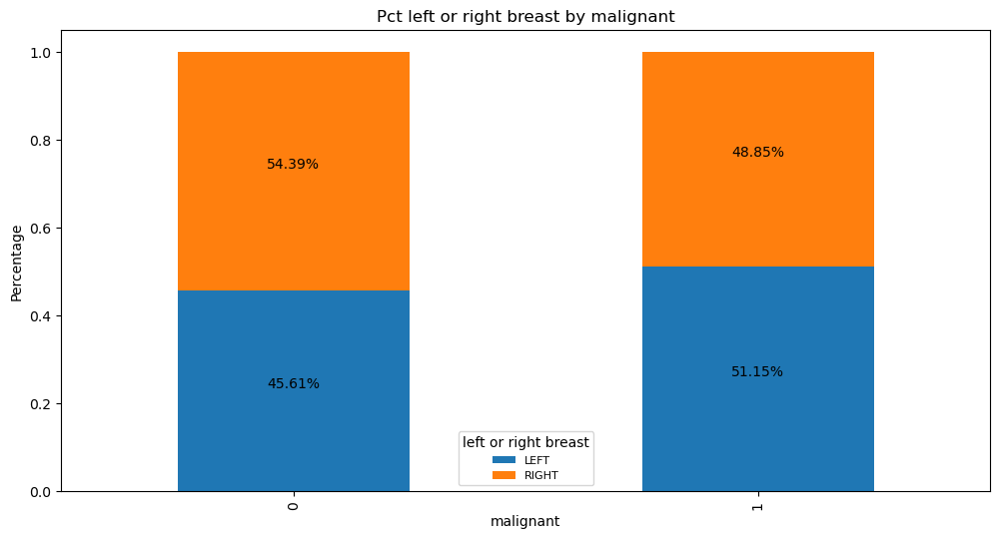

<Figure size 1200x600 with 0 Axes>

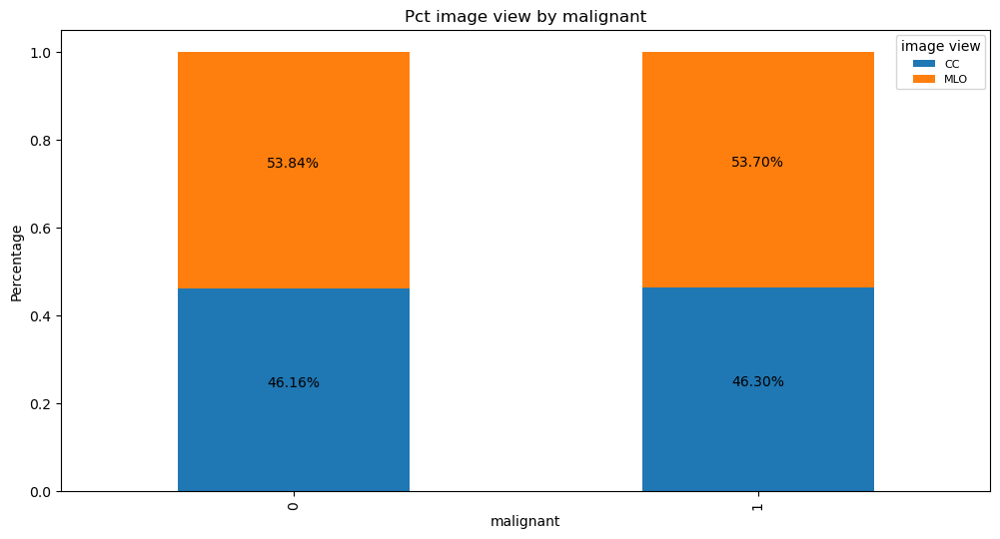

<Figure size 1200x600 with 0 Axes>

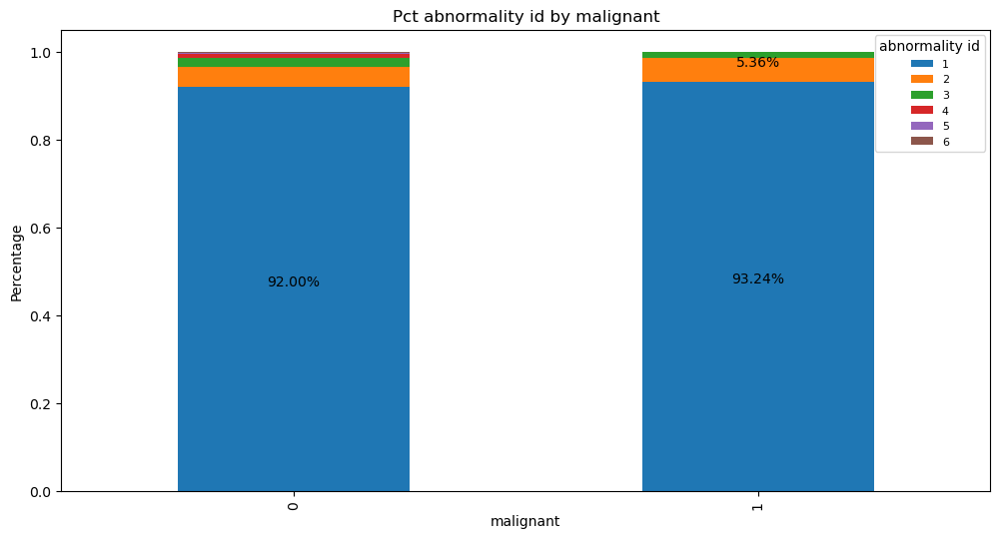

<Figure size 1200x600 with 0 Axes>

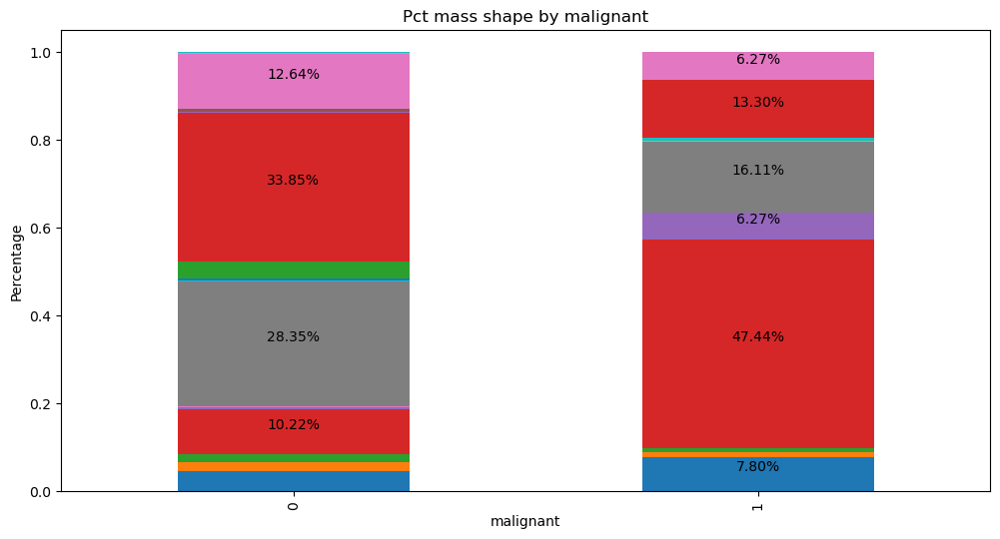

<Figure size 1200x600 with 0 Axes>

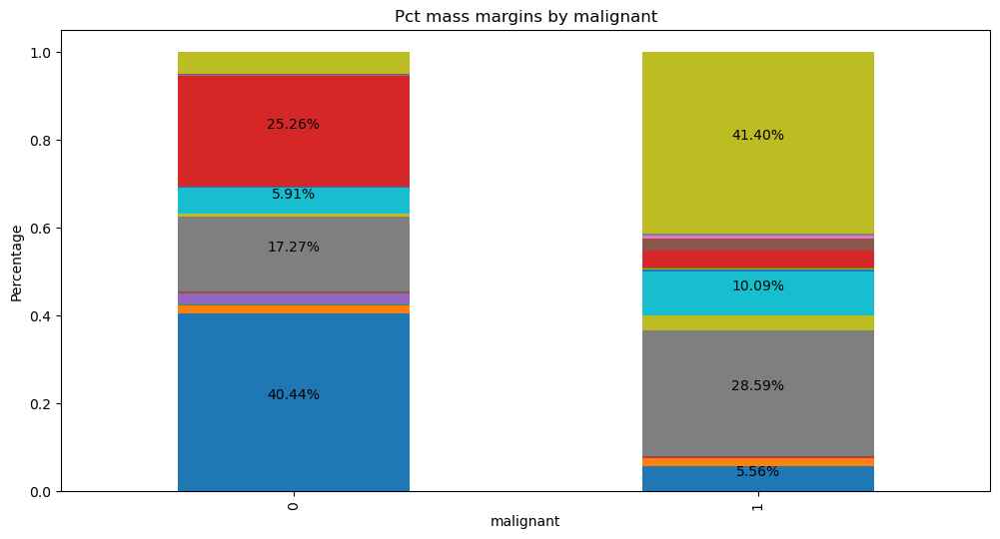

<Figure size 1200x600 with 0 Axes>

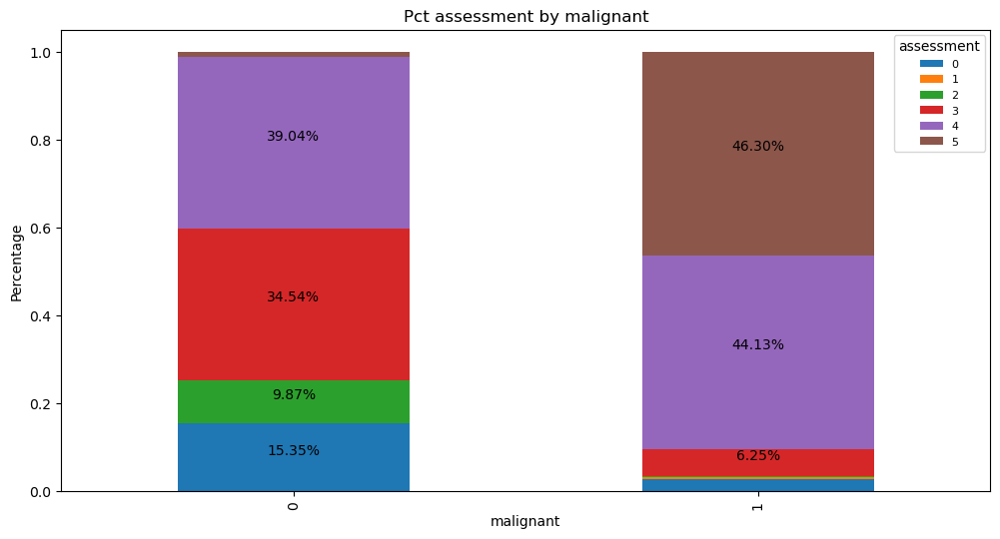

<Figure size 1200x600 with 0 Axes>

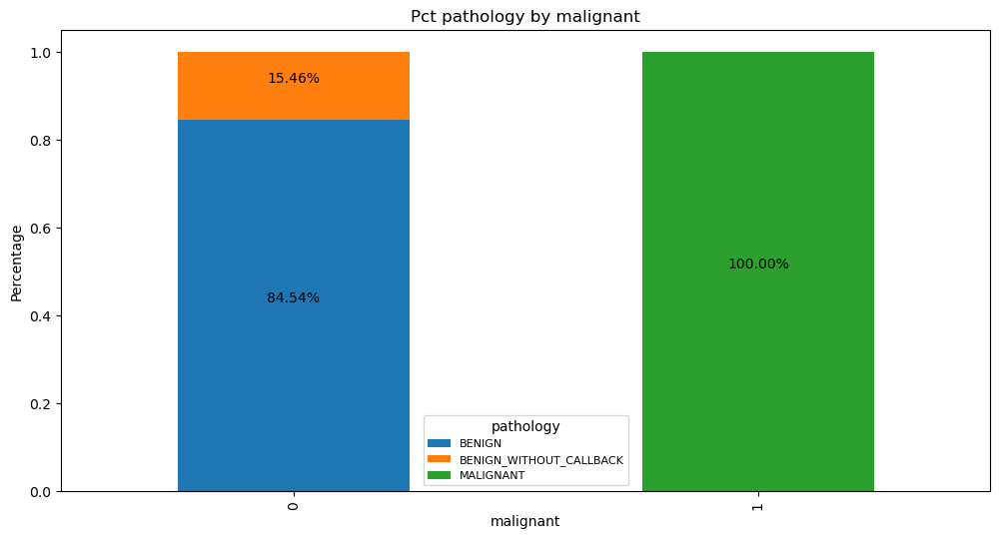

<Figure size 1200x600 with 0 Axes>

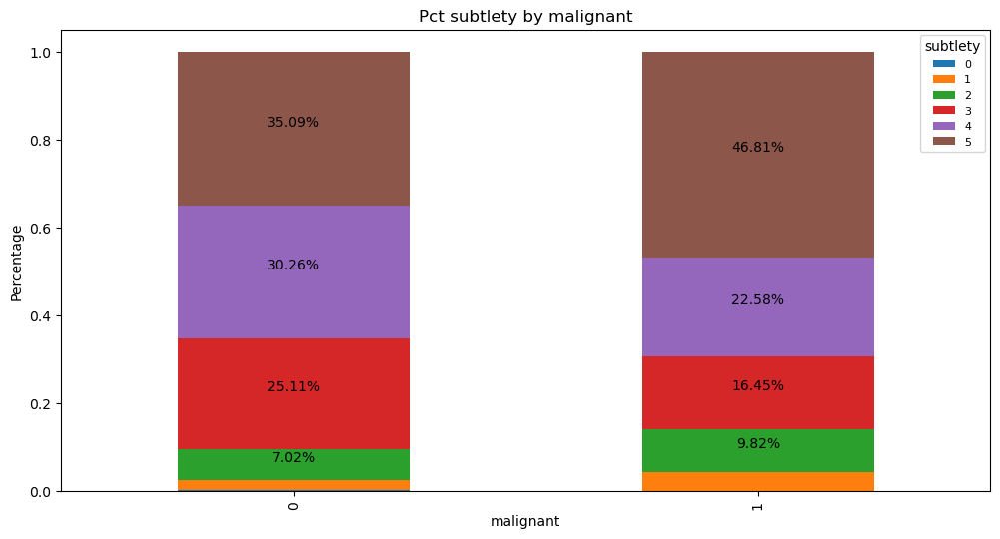

In [23]:
def get_pcts_by_malignant(df, var):
    _ = plt.figure(figsize=(12, 6))
    df = df.groupby('malignant')[var].value_counts(normalize=True).unstack()
    if len(df.columns) <= 10:
        ax = df.plot(kind='bar', stacked=True, figsize=(12, 6))
    else:
        ax = df.plot(kind='bar', stacked=True, figsize=(12, 6), legend=False)
        
    _ = plt.xlabel('malignant')
    _ = plt.ylabel('Percentage')
    _ = plt.title(f'Pct {var} by malignant')
    
    if len(df.columns) <= 10:
        _ = plt.legend(title=var, fontsize=8)
        
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if height > .05:
            _ = ax.annotate(f'{height:.2%}', (x + width/2, y + height / 2), ha='center', va='bottom')

for var in mass_case_description.columns.drop(['patient_id', 'abnormality type', 'image file path', 'cropped image file path', 
                                               'ROI mask file path', 'training_set', 'malignant']):
    get_pcts_by_malignant(mass_case_description, var)

Observations about the categorical features:

-The distribution of mass shape is different between benign and malignant cases.

-The distribution of mass margins is different between benign and malignant cases.

-The distribution of assessment is different between benign and malignant cases.

# Dicom

### Read in CSV Data

In [24]:
dicom = pd.read_csv('../data/raw/csv/dicom_info.csv')

### View Data

In [25]:
dicom.head()

,file_path,image_path,AccessionNumber,BitsAllocated,BitsStored,BodyPartExamined,Columns,ContentDate,ContentTime,ConversionType,HighBit,InstanceNumber,LargestImagePixelValue,Laterality,Modality,PatientBirthDate,PatientID,PatientName,PatientOrientation,PatientSex,PhotometricInterpretation,PixelRepresentation,ReferringPhysicianName,Rows,SOPClassUID,SOPInstanceUID,SamplesPerPixel,SecondaryCaptureDeviceManufacturer,SecondaryCaptureDeviceManufacturerModelName,SeriesDescription,SeriesInstanceUID,SeriesNumber,SmallestImagePixelValue,SpecificCharacterSet,StudyDate,StudyID,StudyInstanceUID,StudyTime
0,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.12930...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308...,NaN,16,16,BREAST,351,20160426,131732.685,WSD,15,1,65535,R,MG,NaN,Mass-Training_P_01265_RIGHT_MLO_1,Mass-Training_P_01265_RIGHT_MLO_1,MLO,NaN,MONOCHROME2,0,NaN,289,1.2.840.10008.5.1.4.1.1.7,1.3.6.1.4.1.9590.100.1.2.426380754911844882201...,1,MathWorks,MATLAB,cropped images,1.3.6.1.4.1.9590.100.1.2.129308726812851964007...,1,23078,ISO_IR 100,20160720.0,DDSM,1.3.6.1.4.1.9590.100.1.2.271867287611061855725...,214951.0
1,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.24838...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386...,NaN,16,16,BREAST,3526,20160426,143829.101,WSD,15,1,65535,R,MG,NaN,Mass-Training_P_01754_RIGHT_CC,Mass-Training_P_01754_RIGHT_CC,CC,NaN,MONOCHROME2,0,NaN,6256,1.2.840.10008.5.1.4.1.1.7,1.3.6.1.4.1.9590.100.1.2.235715018911442345533...,1,MathWorks,MATLAB,full mammogram images,1.3.6.1.4.1.9590.100.1.2.248386742010678582309...,1,0,ISO_IR 100,20160720.0,DDSM,1.3.6.1.4.1.9590.100.1.2.161516517311681906612...,193426.0
2,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.26721...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.267213...,NaN,16,16,BREAST,1546,20160503,111956.298,WSD,15,1,65535,R,MG,NaN,Calc-Training_P_00232_RIGHT_CC,Calc-Training_P_00232_RIGHT_CC,CC,NaN,MONOCHROME2,0,NaN,4126,1.2.840.10008.5.1.4.1.1.7,1.3.6.1.4.1.9590.100.1.2.212917405611495375422...,1,MathWorks,MATLAB,full mammogram images,1.3.6.1.4.1.9590.100.1.2.267213171011171858918...,1,0,ISO_IR 100,20160807.0,DDSM,1.3.6.1.4.1.9590.100.1.2.291043622711253836701...,161814.0
3,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,NaN,16,16,BREAST,97,20160503,115347.770,WSD,15,1,65535,L,MG,NaN,Calc-Test_P_00562_LEFT_CC_2,Calc-Test_P_00562_LEFT_CC_2,CC,NaN,MONOCHROME2,0,NaN,97,1.2.840.10008.5.1.4.1.1.7,1.3.6.1.4.1.9590.100.1.2.405776661412249467913...,1,MathWorks,MATLAB,cropped images,1.3.6.1.4.1.9590.100.1.2.381187369611524586537...,1,32298,ISO_IR 100,20170829.0,DDSM,1.3.6.1.4.1.9590.100.1.2.335006093711888937440...,180109.0
4,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,NaN,8,8,Left Breast,3104,20160503,115347.770,WSD,7,1,255,NaN,MG,NaN,P_00562_LEFT_CC_2.dcm,P_00562^P_00562,CC,NaN,MONOCHROME2,0,NaN,4560,1.2.840.10008.5.1.4.1.1.7,1.3.6.1.4.1.9590.100.1.2.418434643810489919922...,1,MathWorks,MATLAB,NaN,1.3.6.1.4.1.9590.100.1.2.381187369611524586537...,1,0,ISO_IR 100,NaN,DDSM,1.3.6.1.4.1.9590.100.1.2.335006093711888937440...,NaN


### Drop Unnecessary Columns and Fill in Missing Values

#### Drop Columns With Only One Unique Value

In [26]:
for col in dicom.columns:
    if len(dicom[col].drop_duplicates()) == 1:
        dicom = dicom.drop([col], axis=1)

#### Drop Redundant Columns and Columns That Won't Be Used

In [27]:
dicom = dicom.drop(['Columns', 'ContentDate', 'ContentTime', 'PatientName', 'Rows', 'SOPInstanceUID', 'StudyInstanceUID',
            'SeriesInstanceUID', 'SecondaryCaptureDeviceManufacturer','StudyDate', 'StudyTime'], axis=1)

#### Check For Missing Data

In [28]:
dicom.isna().sum()

file_path                    0
image_path                   0
BitsAllocated                0
BitsStored                   0
BodyPartExamined             0
HighBit                      0
LargestImagePixelValue       0
Laterality                 566
PatientID                    0
PatientOrientation           0
SeriesDescription          566
SmallestImagePixelValue      0
dtype: int64

#### Examine Missing Data for Laterality Column

In [29]:
dicom.loc[dicom.Laterality.isna()]

,file_path,image_path,BitsAllocated,BitsStored,BodyPartExamined,HighBit,LargestImagePixelValue,Laterality,PatientID,PatientOrientation,SeriesDescription,SmallestImagePixelValue
4,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,8,8,Left Breast,7,255,NaN,P_00562_LEFT_CC_2.dcm,CC,NaN,0
27,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.28160...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.281604...,8,8,Right Breast,7,255,NaN,P_00857_RIGHT_CC_1.dcm,CC,NaN,0
73,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.18973...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.189733...,8,8,Right Breast,7,255,NaN,P_02464_RIGHT_CC_1.dcm,CC,NaN,0
76,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.31632...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.316322...,8,8,Left Breast,7,255,NaN,P_00789_LEFT_MLO_1.dcm,MLO,NaN,0
85,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.39710...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.397101...,16,16,Left Breast,15,65535,NaN,P_00352_LEFT_MLO.dcm,MLO,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...
10168,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.35934...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.359349...,8,8,Left Breast,7,255,NaN,P_01352_LEFT_CC_1.dcm,CC,NaN,0
10197,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.18495...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.184953...,8,8,Right Breast,7,255,NaN,P_00372_RIGHT_MLO_1.dcm,MLO,NaN,0
10199,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.36274...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.362749...,16,16,Right Breast,15,63282,NaN,P_02153_RIGHT_MLO.dcm,MLO,NaN,0
10203,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.34010...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.340108...,8,8,Right Breast,7,255,NaN,P_00150_RIGHT_MLO_1.dcm,MLO,NaN,0


##### Laterality Refers to Which Breast the Mammogram Was Performed On. We Can Fill In the Missing Values With the "BodyPartExamined" Column and Then Drop That Column

In [30]:
dicom.BodyPartExamined.value_counts()

BodyPartExamined
BREAST          9671
Left Breast      318
Right Breast     248
Name: count, dtype: int64

In [31]:
dicom.loc[dicom.Laterality.isna()].BodyPartExamined.value_counts()

BodyPartExamined
Left Breast     318
Right Breast    248
Name: count, dtype: int64

In [32]:
mask = dicom['Laterality'] == 'Left Breast'
dicom['Laterality'] = dicom['Laterality'].fillna(mask.map({True: 'L', False: 'R'}))
dicom = dicom.drop(['BodyPartExamined'], axis=1)

#### Examine the SeriesDescription column for Missing Values

In [33]:
dicom.loc[dicom.SeriesDescription.isna()]

,file_path,image_path,BitsAllocated,BitsStored,HighBit,LargestImagePixelValue,Laterality,PatientID,PatientOrientation,SeriesDescription,SmallestImagePixelValue
4,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,8,8,7,255,R,P_00562_LEFT_CC_2.dcm,CC,NaN,0
27,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.28160...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.281604...,8,8,7,255,R,P_00857_RIGHT_CC_1.dcm,CC,NaN,0
73,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.18973...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.189733...,8,8,7,255,R,P_02464_RIGHT_CC_1.dcm,CC,NaN,0
76,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.31632...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.316322...,8,8,7,255,R,P_00789_LEFT_MLO_1.dcm,MLO,NaN,0
85,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.39710...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.397101...,16,16,15,65535,R,P_00352_LEFT_MLO.dcm,MLO,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...
10168,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.35934...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.359349...,8,8,7,255,R,P_01352_LEFT_CC_1.dcm,CC,NaN,0
10197,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.18495...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.184953...,8,8,7,255,R,P_00372_RIGHT_MLO_1.dcm,MLO,NaN,0
10199,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.36274...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.362749...,16,16,15,63282,R,P_02153_RIGHT_MLO.dcm,MLO,NaN,0
10203,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.34010...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.340108...,8,8,7,255,R,P_00150_RIGHT_MLO_1.dcm,MLO,NaN,0


##### We Can Use the Pixel Values and the PatientID to Determine What Type of Image We Have

In [34]:
dicom.loc[dicom.SeriesDescription.isna()].LargestImagePixelValue.value_counts().head()

LargestImagePixelValue
255      320
65535    210
65534      6
57442      1
55065      1
Name: count, dtype: int64

##### All "ROI mask images" have a LargestImagePixelValue of 255

In [35]:
print(dicom.loc[dicom.SeriesDescription == 'ROI mask images'].LargestImagePixelValue.value_counts())
print('')
print(dicom.loc[dicom.SeriesDescription == 'ROI mask images'].SmallestImagePixelValue.value_counts())
print('')
print('Max Difference')
print(max(dicom.loc[dicom.SeriesDescription == 'ROI mask images', 'LargestImagePixelValue'] - dicom.loc[dicom.SeriesDescription == 'ROI mask images', 'SmallestImagePixelValue']))

LargestImagePixelValue
255    3247
Name: count, dtype: int64

SmallestImagePixelValue
0    3247
Name: count, dtype: int64

Max Difference
255


##### Cropped Images Have an Abnormality ID in the PatientID. Full Images Do Not.

In [36]:
dicom['PatientID'] = dicom['PatientID'].str.replace('.dcm', '')

In [37]:
dicom['abnormality id'] = dicom['PatientID'].str.extract(r'([1-7]+)$', expand=False).astype(object)

In [38]:
dicom.loc[(dicom.LargestImagePixelValue == 255) & (dicom.SeriesDescription.isna()), 'SeriesDescription'] = 'ROI mask images'
dicom.loc[dicom['abnormality id'].isna(), 'SeriesDescription'] = 'full mammogram images'
dicom['SeriesDescription'] = dicom['SeriesDescription'].fillna('cropped images')
dicom['SeriesDescription'].value_counts()

SeriesDescription
cropped images           3567
ROI mask images          3567
full mammogram images    3103
Name: count, dtype: int64

### Merge Dataframes

#### Create Dataframe That Unions Calcification Data With Mass Data

In [39]:
calc_case_description['type'] = 'Calc'
mass_case_description['type'] = 'Mass'
case_descriptions = pd.concat([calc_case_description, mass_case_description], ignore_index=True)
case_descriptions['calc type'] = case_descriptions['calc type'].fillna('MASS')
case_descriptions['calc distribution'] = case_descriptions['calc distribution'].fillna('MASS')
case_descriptions['mass shape'] = case_descriptions['mass shape'].fillna('CALCIFICATION')
case_descriptions['mass margins'] = case_descriptions['mass margins'].fillna('CALCIFICATION')

In [40]:
case_descriptions['image_path_key'] = case_descriptions['image file path'].str.extract(r'([^/]+)', expand=False)
case_descriptions['cropped_image_path_key'] = case_descriptions['cropped image file path'].str.extract(r'([^/]+)', 
                                                                                                       expand=False)
case_descriptions['ROI mask file path_key'] = case_descriptions['ROI mask file path'].str.extract(r'([^/]+)', expand=False)
case_descriptions.head()

,patient_id,breast density,left or right breast,image view,abnormality id,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path,training_set,malignant,type,mass shape,mass margins,image_path_key,cropped_image_path_key,ROI mask file path_key
0,P_00005,3,RIGHT,CC,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_CC/1.3.6.1.4.1.959...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...,1,1,Calc,CALCIFICATION,CALCIFICATION,Calc-Training_P_00005_RIGHT_CC,Calc-Training_P_00005_RIGHT_CC_1,Calc-Training_P_00005_RIGHT_CC_1
1,P_00005,3,RIGHT,MLO,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_MLO/1.3.6.1.4.1.95...,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....,1,1,Calc,CALCIFICATION,CALCIFICATION,Calc-Training_P_00005_RIGHT_MLO,Calc-Training_P_00005_RIGHT_MLO_1,Calc-Training_P_00005_RIGHT_MLO_1
2,P_00007,4,LEFT,CC,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...,1,0,Calc,CALCIFICATION,CALCIFICATION,Calc-Training_P_00007_LEFT_CC,Calc-Training_P_00007_LEFT_CC_1,Calc-Training_P_00007_LEFT_CC_1
3,P_00007,4,LEFT,MLO,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_MLO/1.3.6.1.4.1.959...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...,1,0,Calc,CALCIFICATION,CALCIFICATION,Calc-Training_P_00007_LEFT_MLO,Calc-Training_P_00007_LEFT_MLO_1,Calc-Training_P_00007_LEFT_MLO_1
4,P_00008,1,LEFT,CC,1,calcification,Unknown,REGIONAL,2,BENIGN_WITHOUT_CALLBACK,3,Calc-Training_P_00008_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...,1,0,Calc,CALCIFICATION,CALCIFICATION,Calc-Training_P_00008_LEFT_CC,Calc-Training_P_00008_LEFT_CC_1,Calc-Training_P_00008_LEFT_CC_1


#### Join Dicom Data to Case Descriptions

In [41]:
print(len(dicom))

dicom_roi_with_case_desc = pd.merge(dicom.loc[dicom.SeriesDescription=='ROI mask images'], 
                                  case_descriptions, left_on='PatientID', right_on='ROI mask file path_key', how='left')

dicom_cropped_with_case_desc = pd.merge(dicom.loc[dicom.SeriesDescription=='cropped images'], case_descriptions, 
                                        left_on='PatientID', right_on='cropped_image_path_key', how='left')

dicom['filename'] = dicom['image_path'].str.extract(r'CBIS-DDSM/jpeg/(.+)', expand=False)
case_descriptions['image_file_name'] = case_descriptions['image file path'].str.extract(r'/(.+)', expand=False)

dicom_full_with_case_desc = pd.merge(dicom.loc[dicom.SeriesDescription=='full mammogram images'], case_descriptions, 
                                     left_on=['PatientID', 'filename'], right_on=['image_path_key', 'image_file_name'], 
                                     how='left')

dicom_with_case_desc = pd.concat([dicom_roi_with_case_desc, dicom_cropped_with_case_desc, dicom_full_with_case_desc], ignore_index=True)
print(len(dicom_with_case_desc))

10237
10237


##### All Records in Dicom Data Get Retained

#### Check That All Case Descriptions Are in Data

In [42]:
print('Full Mammograms')
print(len(case_descriptions['image_path_key'].drop_duplicates()))
print(len(dicom_with_case_desc['image_path_key'].drop_duplicates()))
print('')
print('Cropped Images')
print(len(case_descriptions['cropped_image_path_key'].drop_duplicates()))
print(len(dicom_with_case_desc['cropped_image_path_key'].drop_duplicates()))
print('')
print('ROI mask images')
print(len(case_descriptions['ROI mask file path_key'].drop_duplicates()))
print(len(dicom_with_case_desc['ROI mask file path_key'].drop_duplicates()))

Full Mammograms
3103
3104

Cropped Images
3568
3568

ROI mask images
3568
3568


### Clean Up Dataframe

#### Rename Columns and Drop Redundant Ones

In [43]:
dicom_with_case_desc = dicom_with_case_desc.rename({'abnormality id_x': 'abnormality id', 'PatientID': 'id'}, axis=1)
dicom_with_case_desc['PatientID'] = dicom_with_case_desc['id'].str.extract(r'(P_\d{5})', expand=False)
dicom_with_case_desc = dicom_with_case_desc.drop(['abnormality id_y', 'patient_id','left or right breast', 'image view',
                                                  'image_path_key', 'cropped_image_path_key', 'ROI mask file path_key', 
                                                  'image_file_name', 'filename', 'file_path'], axis=1)

#### Check for Nulls In the "malignant" Column. If It Is Unique By Patient ID, Then Impute, Otherwise Discard Records

In [44]:
print(dicom_with_case_desc.malignant.isna().sum())

3423


In [45]:
malignant = dicom_with_case_desc[['PatientID', 'malignant']].drop_duplicates().dropna()
print(len(malignant))
print(len(malignant.PatientID.drop_duplicates()))

1622
1566


##### malignant is not unique by PatientID. The Records Should Be Dropped.

In [46]:
dicom_with_case_desc = dicom_with_case_desc.dropna(subset=['malignant']).reset_index(drop=True)

In [47]:
dicom_with_case_desc.head()

,image_path,BitsAllocated,BitsStored,HighBit,LargestImagePixelValue,Laterality,id,PatientOrientation,SeriesDescription,SmallestImagePixelValue,abnormality id,breast density,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path,training_set,malignant,type,mass shape,mass margins,PatientID
0,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.153339...,8,8,7,255,R,Calc-Training_P_00181_RIGHT_CC_1,CC,ROI mask images,0,1,4,calcification,PLEOMORPHIC,CLUSTERED,4,BENIGN,1,Calc-Training_P_00181_RIGHT_CC/1.3.6.1.4.1.959...,Calc-Training_P_00181_RIGHT_CC_1/1.3.6.1.4.1.9...,Calc-Training_P_00181_RIGHT_CC_1/1.3.6.1.4.1.9...,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,P_00181
1,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.178994...,8,8,7,255,L,Calc-Training_P_01015_LEFT_CC_1,CC,ROI mask images,0,1,2,calcification,PLEOMORPHIC,LINEAR,4,MALIGNANT,2,Calc-Training_P_01015_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_01015_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_01015_LEFT_CC_1/1.3.6.1.4.1.95...,1.0,1.0,Calc,CALCIFICATION,CALCIFICATION,P_01015
2,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.411833...,8,8,7,255,L,Calc-Training_P_01497_LEFT_CC_1,CC,ROI mask images,0,1,4,calcification,PUNCTATE-AMORPHOUS,REGIONAL,4,BENIGN,3,Calc-Training_P_01497_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_01497_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_01497_LEFT_CC_1/1.3.6.1.4.1.95...,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,P_01497
3,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.236373...,8,8,7,255,R,Mass-Training_P_00242_RIGHT_CC_1,CC,ROI mask images,0,1,2,mass,MASS,MASS,4,BENIGN,5,Mass-Training_P_00242_RIGHT_CC/1.3.6.1.4.1.959...,Mass-Training_P_00242_RIGHT_CC_1/1.3.6.1.4.1.9...,Mass-Training_P_00242_RIGHT_CC_1/1.3.6.1.4.1.9...,1.0,0.0,Mass,LOBULATED,CIRCUMSCRIBED,P_00242
4,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.357008...,8,8,7,255,R,Mass-Training_P_00634_RIGHT_MLO_1,MLO,ROI mask images,0,1,4,mass,MASS,MASS,5,MALIGNANT,3,Mass-Training_P_00634_RIGHT_MLO/1.3.6.1.4.1.95...,Mass-Training_P_00634_RIGHT_MLO_1/1.3.6.1.4.1....,Mass-Training_P_00634_RIGHT_MLO_1/1.3.6.1.4.1....,1.0,1.0,Mass,ARCHITECTURAL_DISTORTION,SPICULATED,P_00634


In [48]:
dicom_with_case_desc.SeriesDescription.value_counts()

SeriesDescription
cropped images     3567
ROI mask images    3247
Name: count, dtype: int64

##### None of the Full Mammography Images Were Labeled (They Don't Exist in the Folders, Either). Since We Can't Impute the Missing Data, We Only Have Cropped Images and ROI Mask Images to Look At.

In [49]:
dicom_with_case_desc = dicom_with_case_desc.drop(['image file path', 'cropped image file path', 'ROI mask file path'], axis=1)

### View Sample Images

#### Set Image Paths and Filter Out Images That Don't Exist

In [50]:
dicom_with_case_desc['image_path'] = '../data/raw/' + dicom_with_case_desc['image_path'].str.extract(r'CBIS-DDSM/(.+)', expand=False)

In [51]:
def file_exists(file_path):
    try:
        return os.path.exists(file_path)
    except:
        False

dicom_with_case_desc['image_path_exists'] = dicom_with_case_desc['image_path'].apply(file_exists)

In [52]:
dicom_with_case_desc = dicom_with_case_desc.loc[dicom_with_case_desc.image_path_exists==True]
dicom_with_case_desc = dicom_with_case_desc.drop(['image_path_exists', 'PatientID'], axis=1).reset_index(drop=True)

#### Unstack Cropped Images From ROI Masks and Join Them Into Same Row on ID

In [53]:
cropped_images = dicom_with_case_desc.loc[dicom_with_case_desc['SeriesDescription'] == 'cropped images']
roi_masks = dicom_with_case_desc.loc[dicom_with_case_desc['SeriesDescription'] == 'ROI mask images']

In [54]:
images = pd.merge(cropped_images, roi_masks, on='id', how='left', suffixes=['', '_roi'])
images = images.drop(['Laterality_roi', 'PatientOrientation_roi', 'SeriesDescription_roi',
                                      'SmallestImagePixelValue_roi', 'abnormality id_roi', 'breast density_roi', 
                                      'abnormality type_roi', 'calc type_roi', 'calc distribution_roi', 'assessment_roi', 
                                      'pathology_roi', 'subtlety_roi', 'training_set_roi', 'malignant_roi', 'type_roi',
                                      'mass shape_roi', 'mass margins_roi'], axis=1)
images.head()

,image_path,BitsAllocated,BitsStored,HighBit,LargestImagePixelValue,Laterality,id,PatientOrientation,SeriesDescription,SmallestImagePixelValue,abnormality id,breast density,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,training_set,malignant,type,mass shape,mass margins,image_path_roi,BitsAllocated_roi,BitsStored_roi,HighBit_roi,LargestImagePixelValue_roi
0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1293...,16,16,15,65535,R,Mass-Training_P_01265_RIGHT_MLO_1,MLO,cropped images,23078,1,2,mass,MASS,MASS,3,BENIGN,4,1.0,0.0,Mass,OVAL,CIRCUMSCRIBED,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1532...,8.0,8.0,7.0,255.0
1,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.3811...,16,16,15,65535,L,Calc-Test_P_00562_LEFT_CC_2,CC,cropped images,32298,2,2,calcification,LUCENT_CENTER,Unknown,2,BENIGN_WITHOUT_CALLBACK,4,0.0,0.0,Calc,CALCIFICATION,CALCIFICATION,NaN,NaN,NaN,NaN,NaN
2,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,16,16,15,65535,R,Calc-Training_P_00181_RIGHT_CC_1,CC,cropped images,44323,1,4,calcification,PLEOMORPHIC,CLUSTERED,4,BENIGN,1,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,8.0,8.0,7.0,255.0
3,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,16,16,15,65535,L,Calc-Training_P_01015_LEFT_CC_1,CC,cropped images,24057,1,2,calcification,PLEOMORPHIC,LINEAR,4,MALIGNANT,2,1.0,1.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,8.0,8.0,7.0,255.0
4,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,16,16,15,65535,L,Calc-Training_P_01497_LEFT_CC_1,CC,cropped images,0,1,4,calcification,PUNCTATE-AMORPHOUS,REGIONAL,4,BENIGN,3,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,8.0,8.0,7.0,255.0


#### Create New Image With ROI Overlayed Over Cropped Images

In [55]:
def combine_images(row):
    image_path = row['image_path']
    image_path_roi = row['image_path_roi']
    image_path_combined = row['image_path_combined']
    
    if file_exists(image_path_combined):
        pass
    else:
        image = Image.open(image_path)

        if file_exists(image_path_roi):
            image_roi = Image.open(image_path_roi)
            image_roi = image_roi.resize(image.size)

            image.paste(image_roi, (0, 0), mask=image_roi)

        os.makedirs(os.path.dirname(image_path_combined), exist_ok=True)
        image.save(image_path_combined)

images['image_path_combined'] = images.image_path.str.extract(r'(.*)/.*', expand=False) + '/combined_image/' + images.id + '.jpg'
_ = images.apply(combine_images, axis=1)

#### Resize Images to Average Width and Height

In [56]:
images.head()

,image_path,BitsAllocated,BitsStored,HighBit,LargestImagePixelValue,Laterality,id,PatientOrientation,SeriesDescription,SmallestImagePixelValue,abnormality id,breast density,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,training_set,malignant,type,mass shape,mass margins,image_path_roi,BitsAllocated_roi,BitsStored_roi,HighBit_roi,LargestImagePixelValue_roi,image_path_combined
0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1293...,16,16,15,65535,R,Mass-Training_P_01265_RIGHT_MLO_1,MLO,cropped images,23078,1,2,mass,MASS,MASS,3,BENIGN,4,1.0,0.0,Mass,OVAL,CIRCUMSCRIBED,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1532...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1293...
1,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.3811...,16,16,15,65535,L,Calc-Test_P_00562_LEFT_CC_2,CC,cropped images,32298,2,2,calcification,LUCENT_CENTER,Unknown,2,BENIGN_WITHOUT_CALLBACK,4,0.0,0.0,Calc,CALCIFICATION,CALCIFICATION,NaN,NaN,NaN,NaN,NaN,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.3811...
2,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,16,16,15,65535,R,Calc-Training_P_00181_RIGHT_CC_1,CC,cropped images,44323,1,4,calcification,PLEOMORPHIC,CLUSTERED,4,BENIGN,1,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...
3,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,16,16,15,65535,L,Calc-Training_P_01015_LEFT_CC_1,CC,cropped images,24057,1,2,calcification,PLEOMORPHIC,LINEAR,4,MALIGNANT,2,1.0,1.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...
4,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,16,16,15,65535,L,Calc-Training_P_01497_LEFT_CC_1,CC,cropped images,0,1,4,calcification,PUNCTATE-AMORPHOUS,REGIONAL,4,BENIGN,3,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...


In [57]:
def get_image_size(image_path):
    with Image.open(image_path) as img:
        return img.size

images['image_size'] = images['image_path_combined'].apply(get_image_size)

average_width = int(images['image_size'].apply(lambda size: size[0]).mean())
average_height = int(images['image_size'].apply(lambda size: size[1]).mean())
average_size = (average_width, average_height)

def resize_and_save_image(row, size):
    image_path = row['image_path_combined']
    image_path_combined = row['image_path_combined_resized']
    
    image = Image.open(image_path)
    image = image.resize(size)
    
    os.makedirs(os.path.dirname(image_path_combined), exist_ok=True)
    image.save(image_path_combined)
    
images['image_path_combined_resized'] = '../data/processed/jpeg/' + images['id'] + '/' + images['id'] + '.jpg'
_ = images.apply(lambda row: resize_and_save_image(row, average_size), axis=1)

#### Function to Display Images

In [58]:
def display_images(df, image_path):
    
    fig, axes = plt.subplots(5, 5, figsize=(12, 12))

    axes = axes.ravel()

    for i, (index, row) in enumerate(df.head(25).iterrows()):
        if file_exists(row[image_path]):
            image = Image.open(row[image_path])
            axes[i].imshow(image)

        axes[i].axis('off')

        axes[i].set_title(row['id'], fontsize=8)

    plt.tight_layout()


#### Malignant Images

In [59]:
malignant = images.loc[images.malignant==1]
malignant_images = images.sample(n=35, random_state=42)

##### Cropped Images

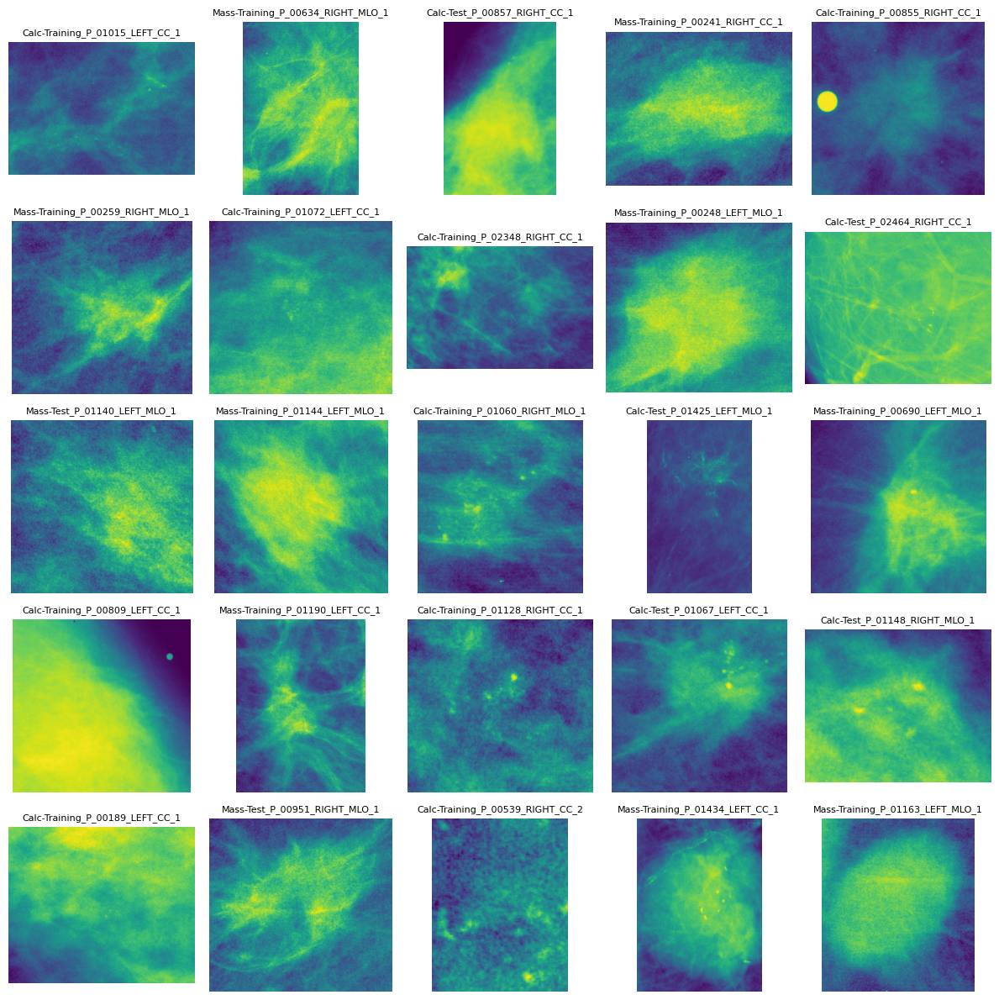

In [60]:
display_images(malignant, 'image_path')

##### ROIs

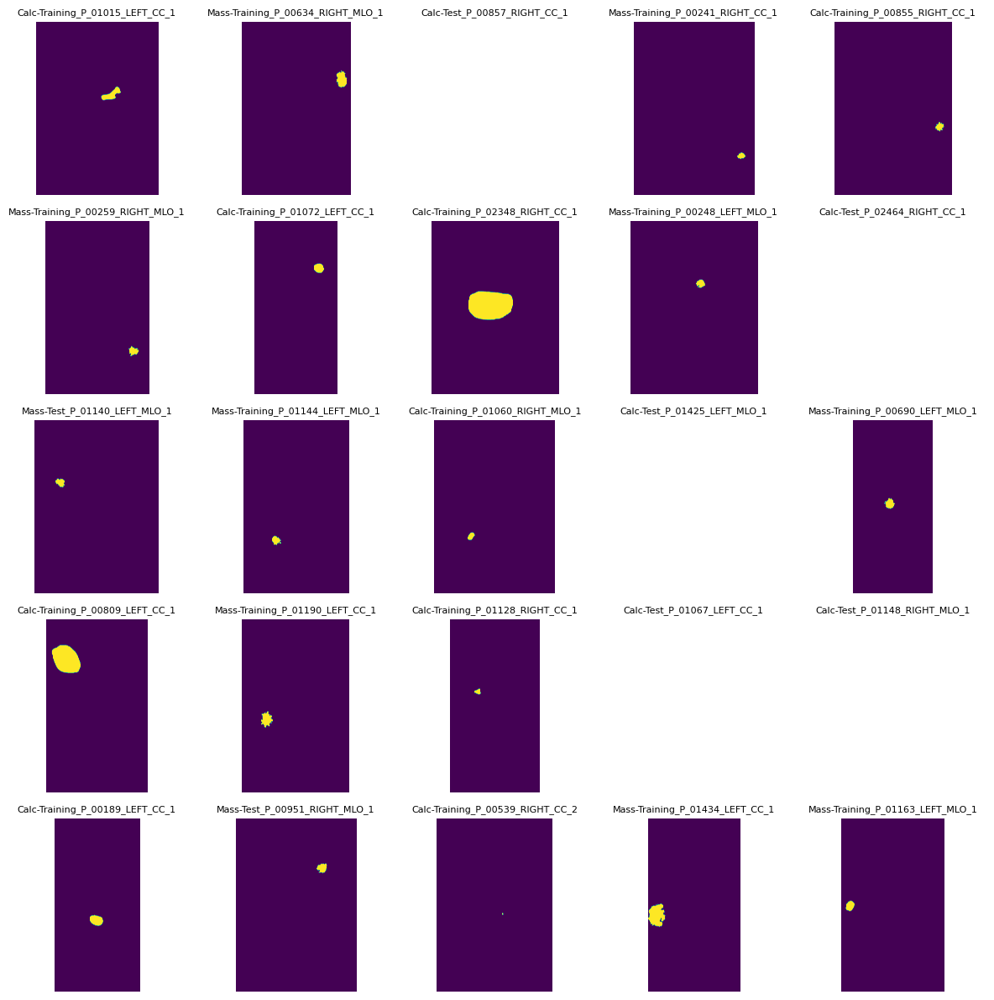

In [61]:
display_images(malignant, 'image_path_roi')

##### Combined

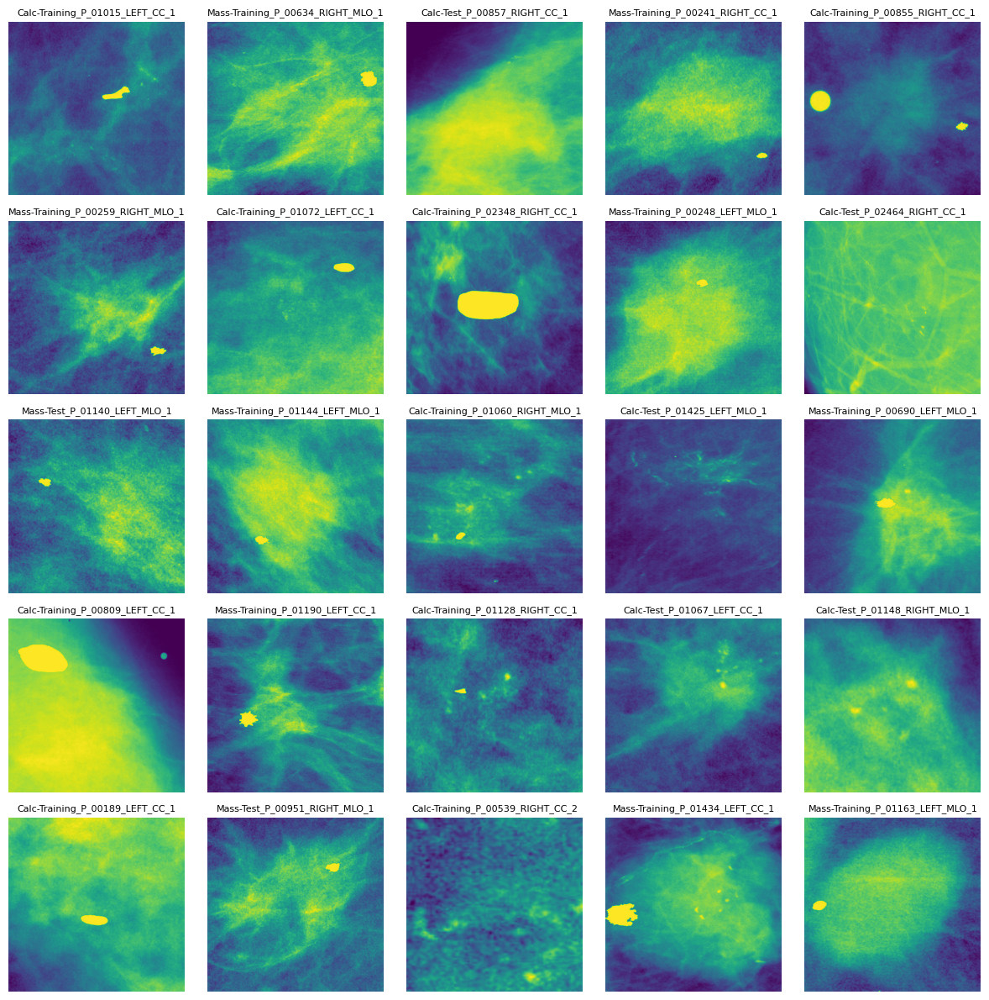

In [62]:
display_images(malignant, 'image_path_combined_resized')

#### Benign Images

In [63]:
benign = images.loc[images. malignant==0]
benign = benign.sample(n=25, random_state=42)

##### Cropped Images

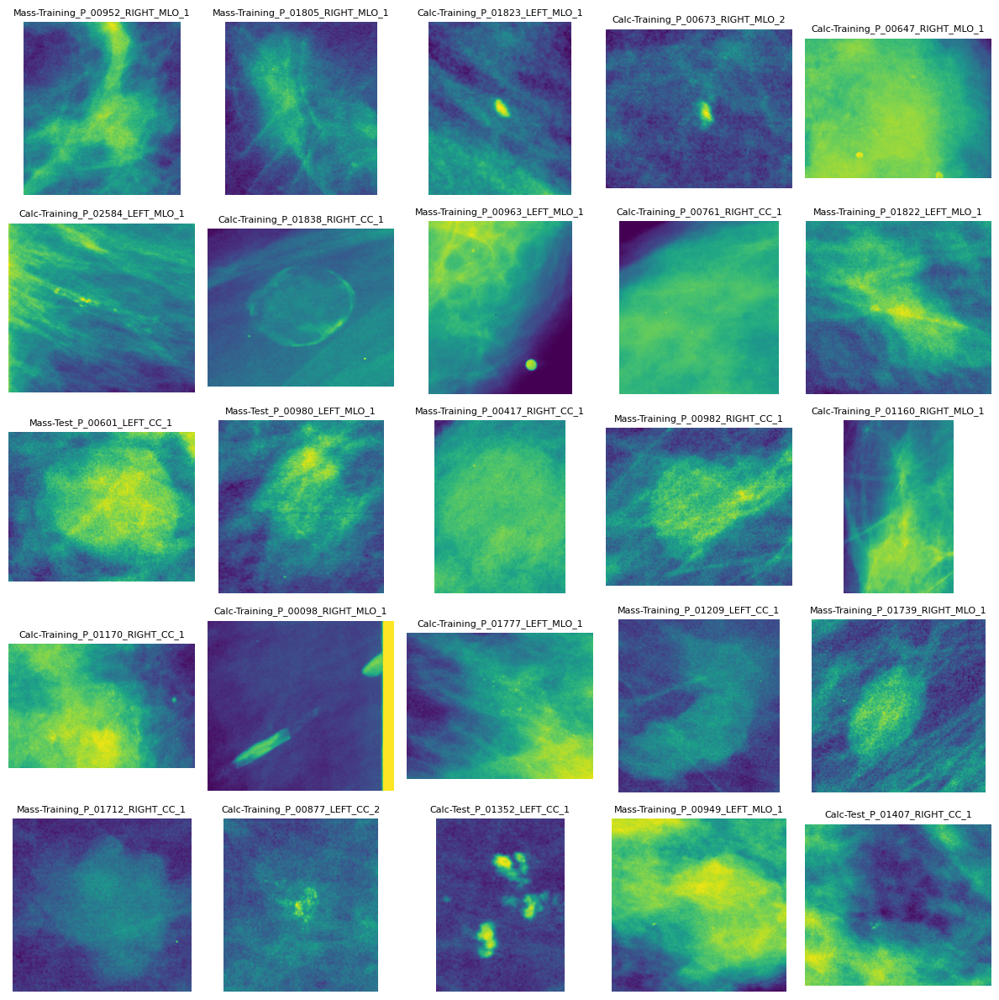

In [64]:
display_images(benign, 'image_path')

##### ROIs

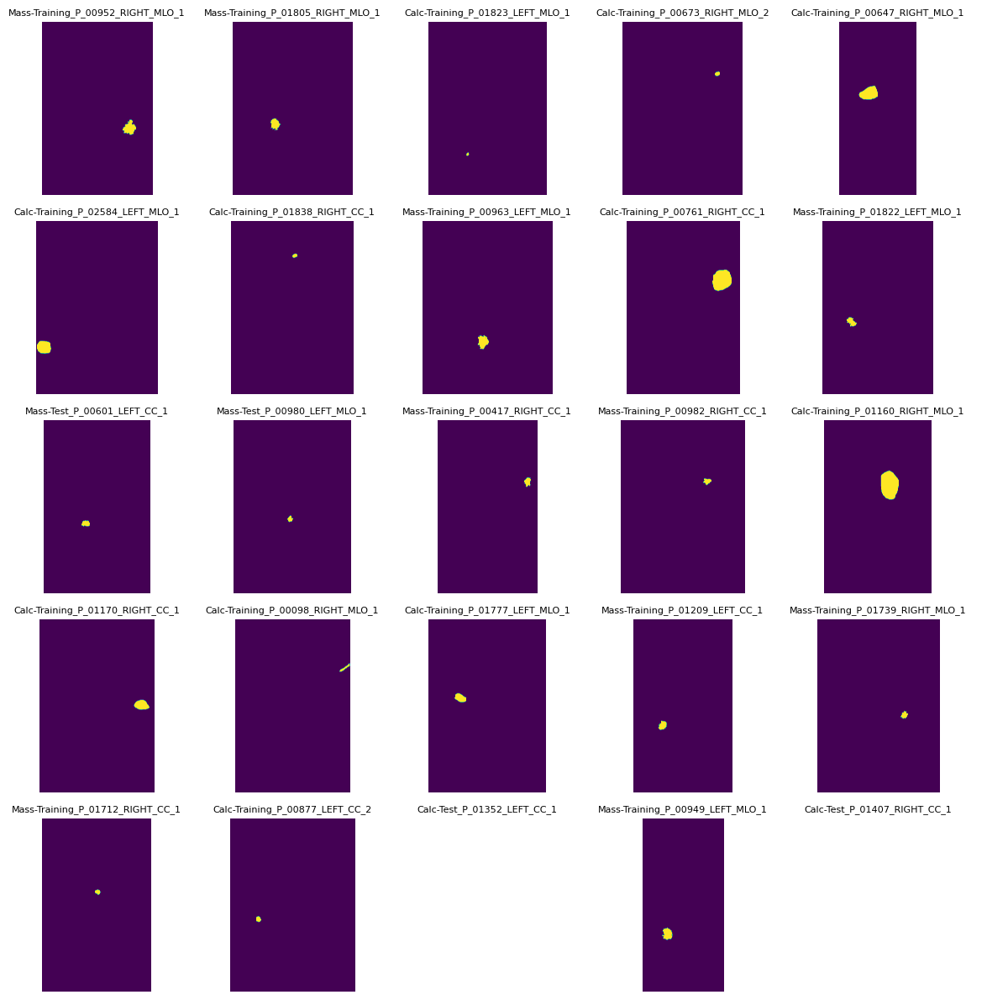

In [65]:
display_images(benign, 'image_path_roi')

##### Combined

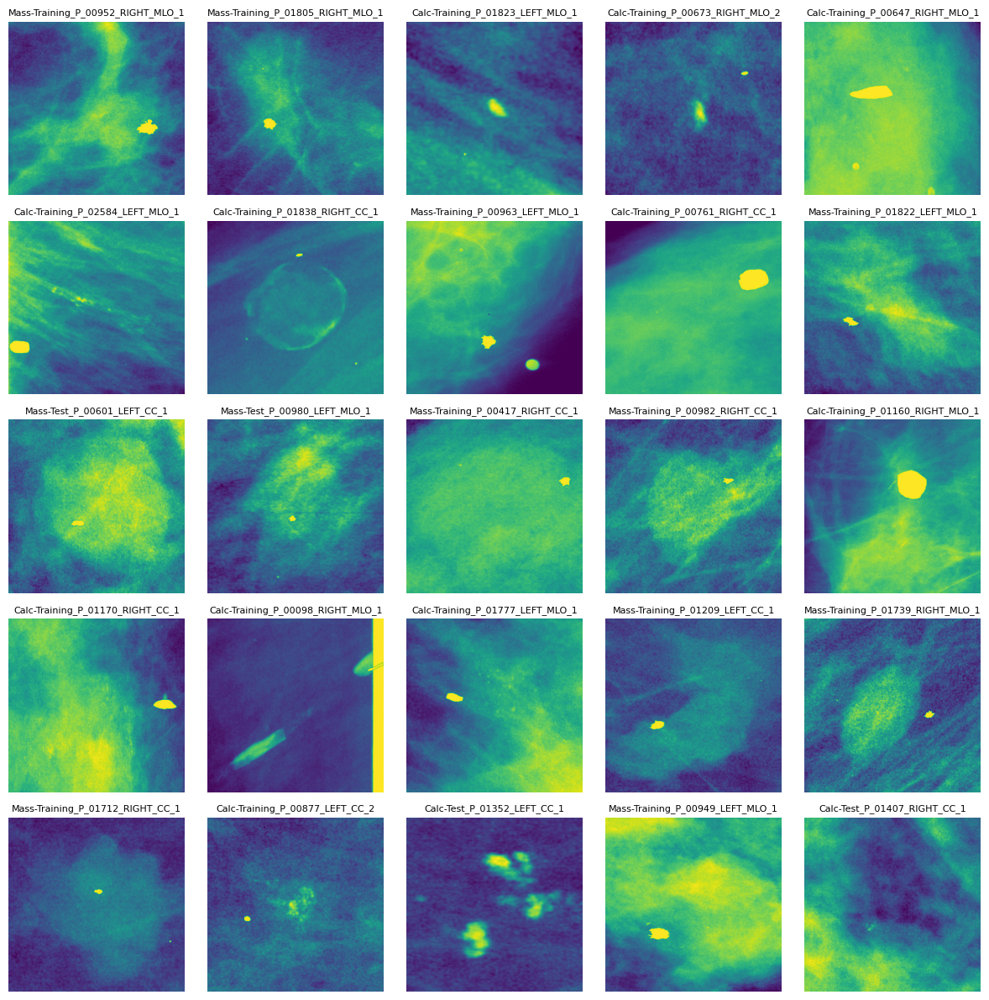

In [66]:
display_images(benign, 'image_path_combined_resized')

# Final Dataset

### View Data

In [67]:
images.head()

,image_path,BitsAllocated,BitsStored,HighBit,LargestImagePixelValue,Laterality,id,PatientOrientation,SeriesDescription,SmallestImagePixelValue,abnormality id,breast density,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,training_set,malignant,type,mass shape,mass margins,image_path_roi,BitsAllocated_roi,BitsStored_roi,HighBit_roi,LargestImagePixelValue_roi,image_path_combined,image_size,image_path_combined_resized
0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1293...,16,16,15,65535,R,Mass-Training_P_01265_RIGHT_MLO_1,MLO,cropped images,23078,1,2,mass,MASS,MASS,3,BENIGN,4,1.0,0.0,Mass,OVAL,CIRCUMSCRIBED,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1532...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1293...,"(351, 289)",../data/processed/jpeg/Mass-Training_P_01265_R...
1,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.3811...,16,16,15,65535,L,Calc-Test_P_00562_LEFT_CC_2,CC,cropped images,32298,2,2,calcification,LUCENT_CENTER,Unknown,2,BENIGN_WITHOUT_CALLBACK,4,0.0,0.0,Calc,CALCIFICATION,CALCIFICATION,NaN,NaN,NaN,NaN,NaN,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.3811...,"(97, 97)",../data/processed/jpeg/Calc-Test_P_00562_LEFT_...
2,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,16,16,15,65535,R,Calc-Training_P_00181_RIGHT_CC_1,CC,cropped images,44323,1,4,calcification,PLEOMORPHIC,CLUSTERED,4,BENIGN,1,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1533...,"(393, 409)",../data/processed/jpeg/Calc-Training_P_00181_R...
3,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,16,16,15,65535,L,Calc-Training_P_01015_LEFT_CC_1,CC,cropped images,24057,1,2,calcification,PLEOMORPHIC,LINEAR,4,MALIGNANT,2,1.0,1.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.1789...,"(611, 436)",../data/processed/jpeg/Calc-Training_P_01015_L...
4,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,16,16,15,65535,L,Calc-Training_P_01497_LEFT_CC_1,CC,cropped images,0,1,4,calcification,PUNCTATE-AMORPHOUS,REGIONAL,4,BENIGN,3,1.0,0.0,Calc,CALCIFICATION,CALCIFICATION,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,8.0,8.0,7.0,255.0,../data/raw/jpeg/1.3.6.1.4.1.9590.100.1.2.4118...,"(809, 1217)",../data/processed/jpeg/Calc-Training_P_01497_L...


In [68]:
def set_numeric_object(df, col):
    return df[col].astype(int).astype(object)
for col in ['breast density', 'abnormality id', 'assessment', 'subtlety']:
    images[col] = set_numeric_object(images, col)

### Numerical Features

#### View Summary Statistics

In [69]:
images[['BitsAllocated', 'BitsStored', 'HighBit', 'LargestImagePixelValue', 'SmallestImagePixelValue', 
        'BitsAllocated_roi', 'BitsStored_roi', 'HighBit_roi', 'LargestImagePixelValue_roi',
        'breast density', 'abnormality id', 'assessment', 'subtlety', 'malignant']].describe()

,BitsAllocated,BitsStored,HighBit,LargestImagePixelValue,SmallestImagePixelValue,BitsAllocated_roi,BitsStored_roi,HighBit_roi,LargestImagePixelValue_roi,malignant
count,3567.0,3567.0,3567.0,3567.000000,3567.000000,3247.0,3247.0,3247.0,3247.0,3567.000000
mean,16.0,16.0,15.0,65533.528736,26673.100364,8.0,8.0,7.0,255.0,0.408466
std,0.0,0.0,0.0,87.870333,14635.745159,0.0,0.0,0.0,0.0,0.491619
min,16.0,16.0,15.0,60287.000000,0.000000,8.0,8.0,7.0,255.0,0.000000
25%,16.0,16.0,15.0,65535.000000,17406.500000,8.0,8.0,7.0,255.0,0.000000
50%,16.0,16.0,15.0,65535.000000,30249.000000,8.0,8.0,7.0,255.0,0.000000
75%,16.0,16.0,15.0,65535.000000,37721.500000,8.0,8.0,7.0,255.0,1.000000
max,16.0,16.0,15.0,65535.000000,59538.000000,8.0,8.0,7.0,255.0,1.000000


#### Barplots of Averages by "malignant"

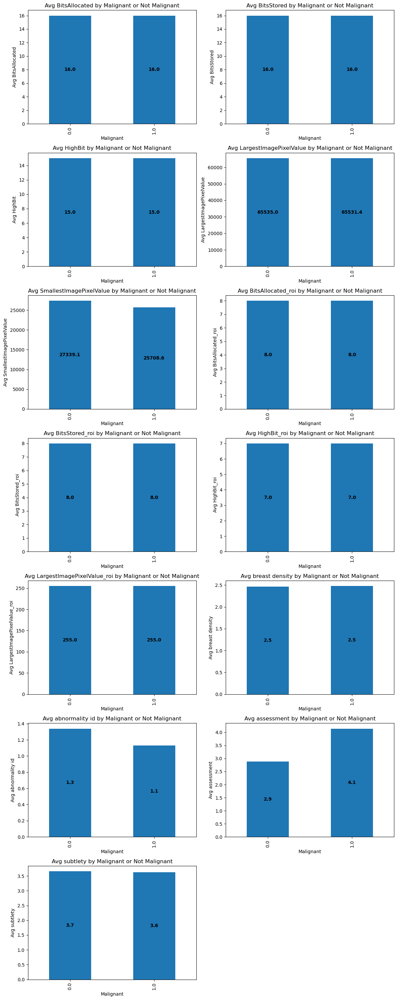

In [70]:
def get_avg_by_malignant(df, columns):
    plt.figure(figsize=(12, 30))
    for i, col in enumerate(columns, start=1):
        plt.subplot(7, 2, i)
        means = pd.DataFrame(df.groupby('malignant')[col].mean().reset_index())
        ax = means.plot(x='malignant', y=col, kind='bar', ax=plt.gca(), legend=False)
        plt.title(f'Avg {col} by Malignant or Not Malignant')
        plt.xlabel('Malignant')
        plt.ylabel(f'Avg {col}')
        for p in ax.patches:
            width, height = p.get_width(), p.get_height()
            x, y = p.get_xy()
            ax.annotate(f'{height:.1f}', (x + width/2, y + height/2), ha='center', va='center', fontweight='bold')
    plt.tight_layout()
    
columns = ['BitsAllocated', 'BitsStored', 'HighBit', 'LargestImagePixelValue', 'SmallestImagePixelValue',
           'BitsAllocated_roi', 'BitsStored_roi', 'HighBit_roi', 'LargestImagePixelValue_roi',
           'breast density', 'abnormality id', 'assessment', 'subtlety']
get_avg_by_malignant(images, columns)

Observations about the numerical features:

-Most of the features have similar average values between malignant and benign cases.

-Average abnormality id and assessment are the exceptions. Average abnormality is higher in benign cases and assessment is higher in malignant ones.

#### Drop Unused Columns

In [71]:
images = images.drop(['BitsAllocated', 'BitsStored', 'HighBit', 'LargestImagePixelValue', 'SmallestImagePixelValue', 
                      'BitsAllocated_roi', 'BitsStored_roi', 'HighBit_roi', 'LargestImagePixelValue_roi', 
                      'SeriesDescription', 'image_size'], axis=1)

### Categorical Columns

#### Stacked Barplots by "malignant"

C:\Users\7037m\AppData\Local\Temp\ipykernel_5104\1913684614.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _ = plt.figure(figsize=(12, 6))


<Figure size 1200x600 with 0 Axes>

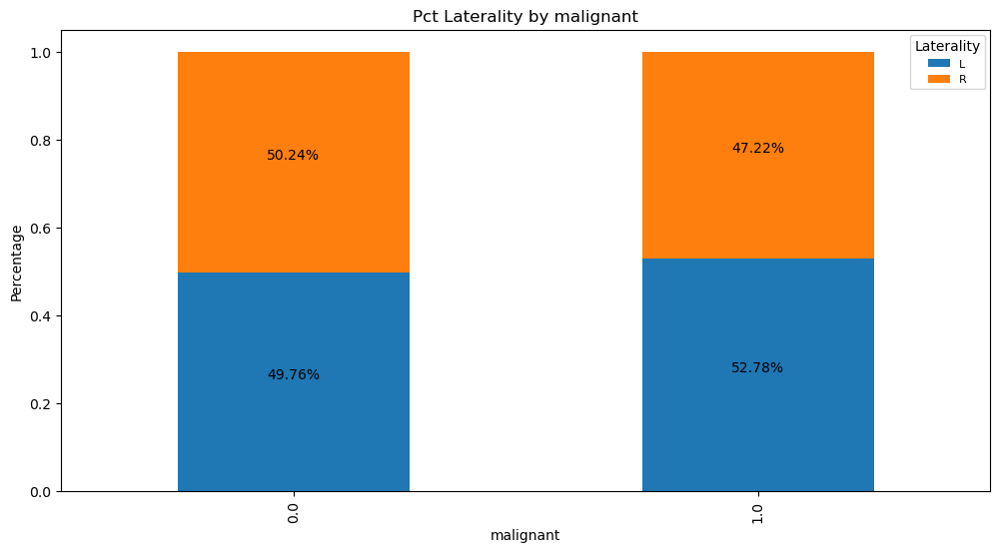

<Figure size 1200x600 with 0 Axes>

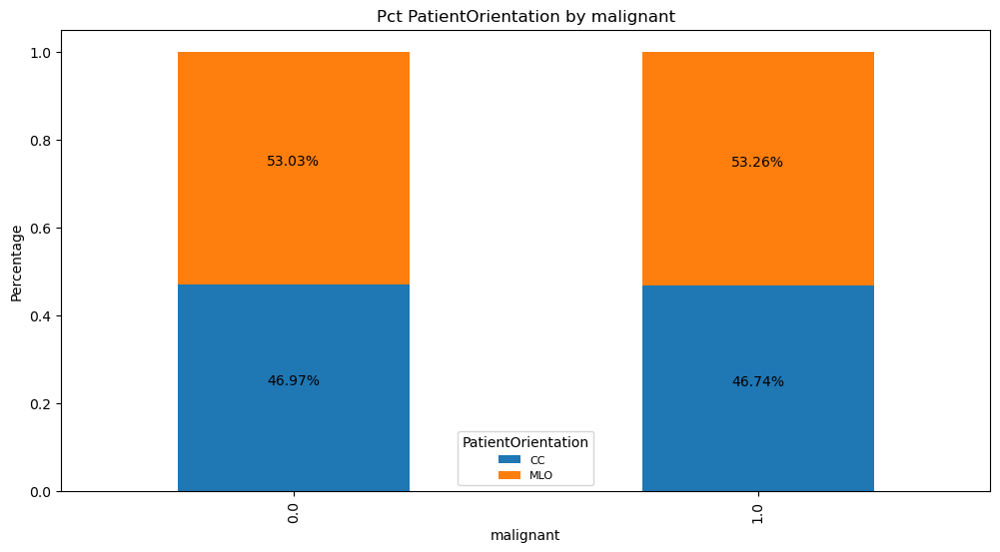

<Figure size 1200x600 with 0 Axes>

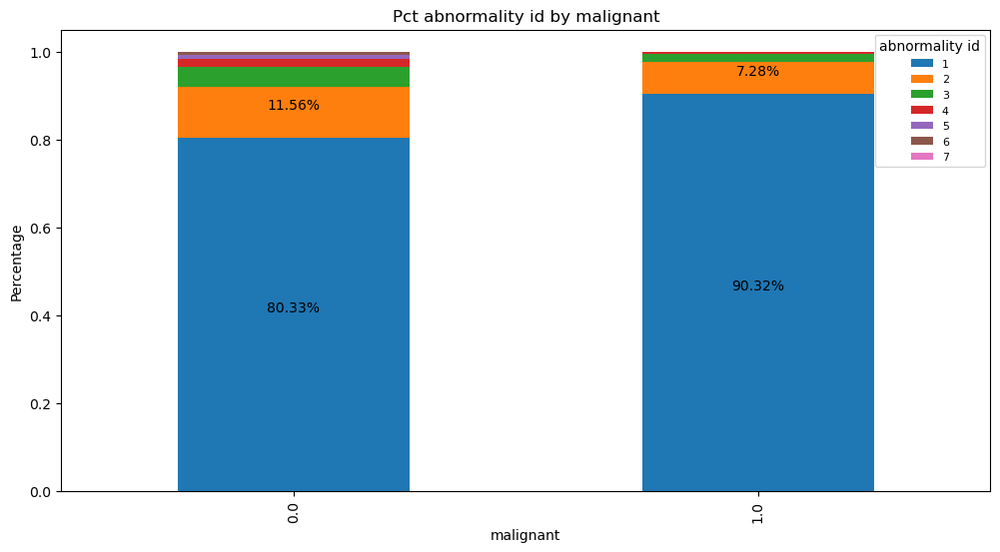

<Figure size 1200x600 with 0 Axes>

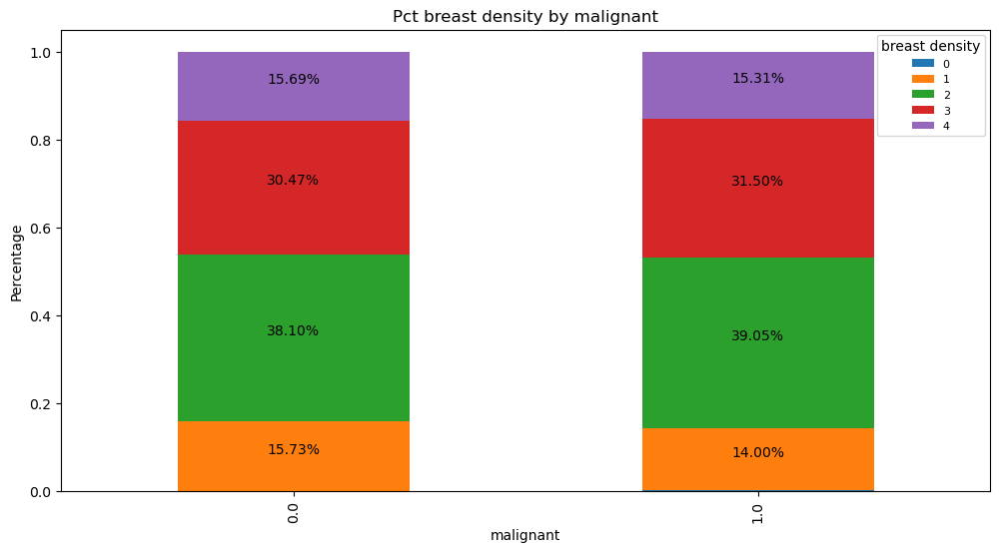

<Figure size 1200x600 with 0 Axes>

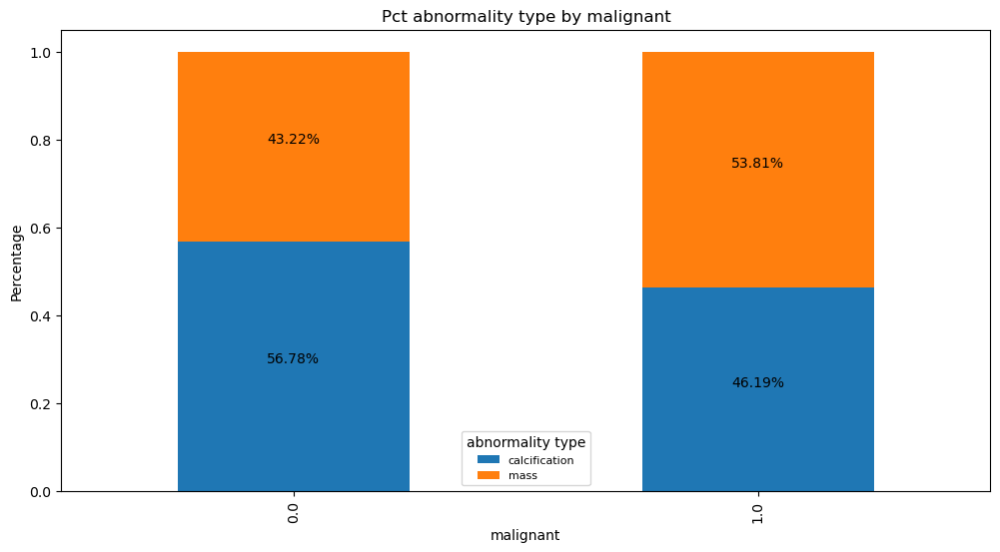

<Figure size 1200x600 with 0 Axes>

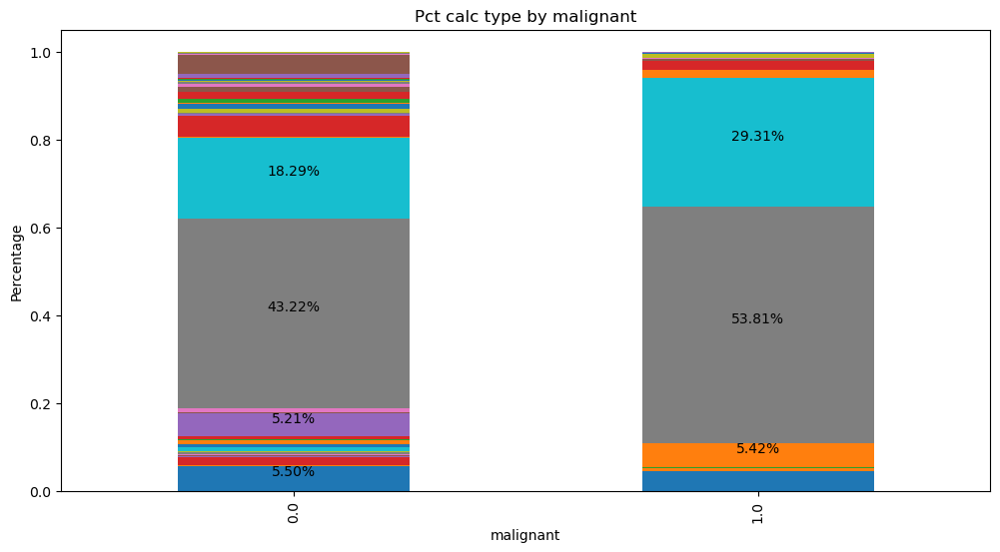

<Figure size 1200x600 with 0 Axes>

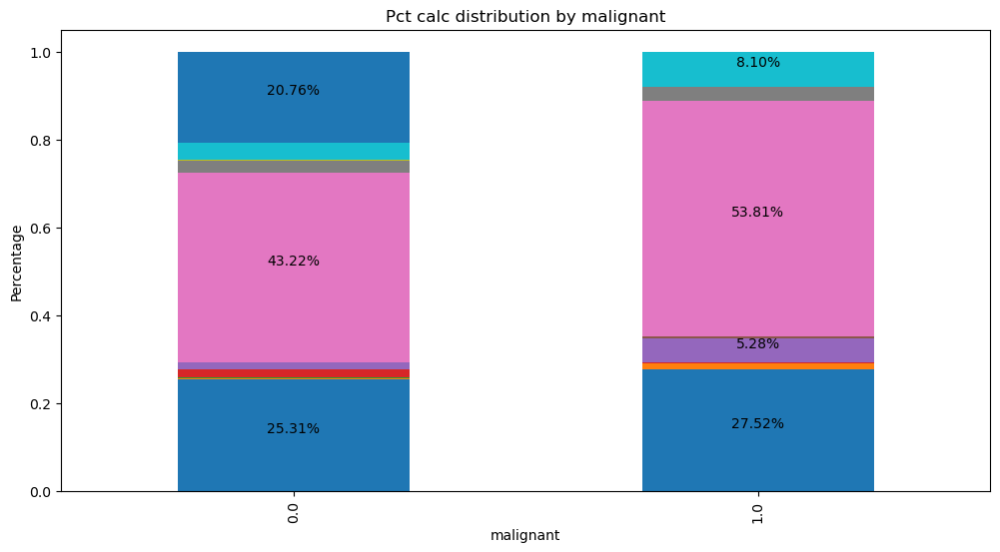

<Figure size 1200x600 with 0 Axes>

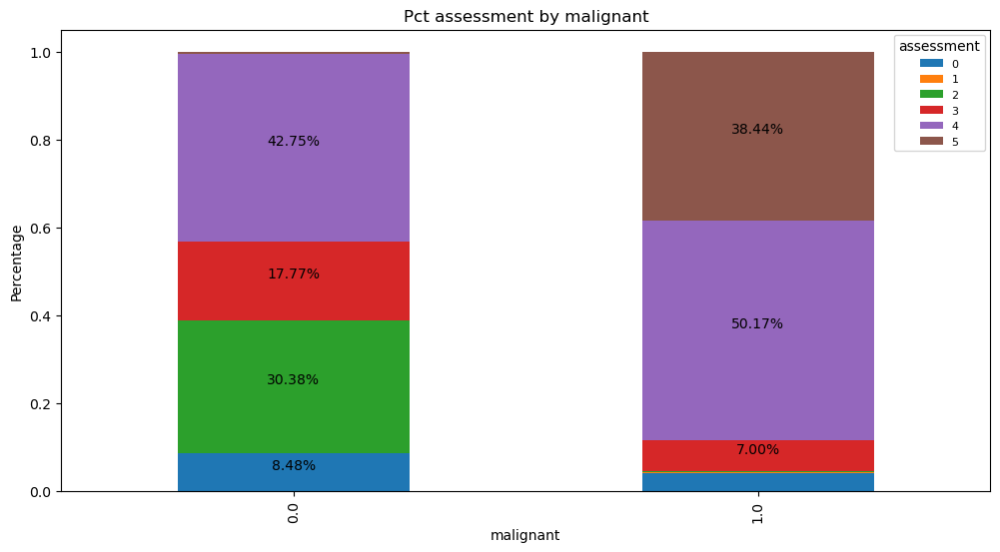

<Figure size 1200x600 with 0 Axes>

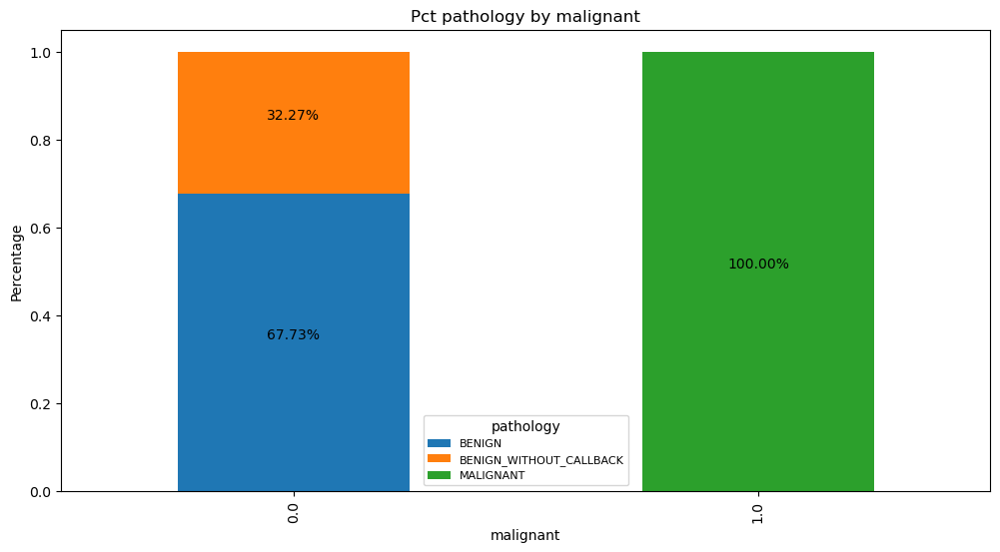

<Figure size 1200x600 with 0 Axes>

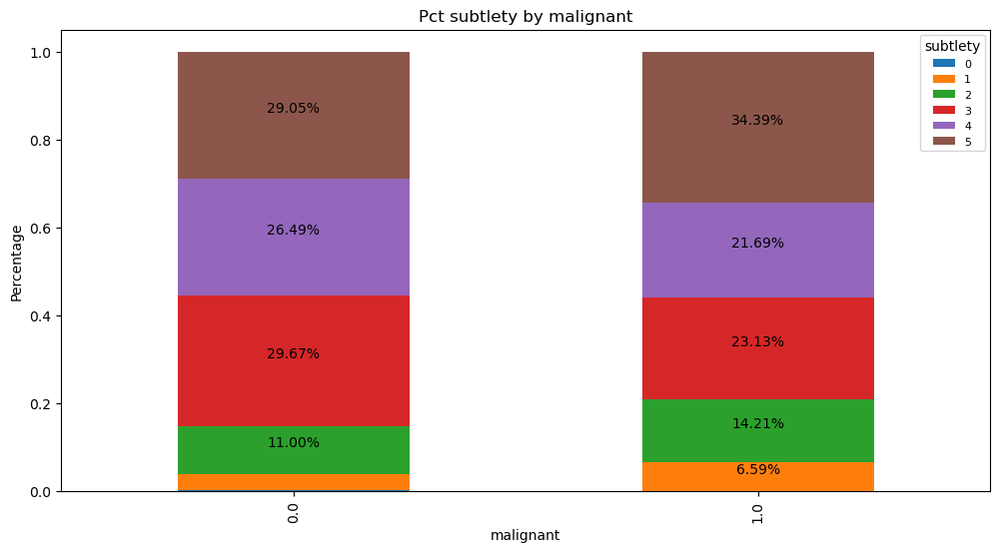

<Figure size 1200x600 with 0 Axes>

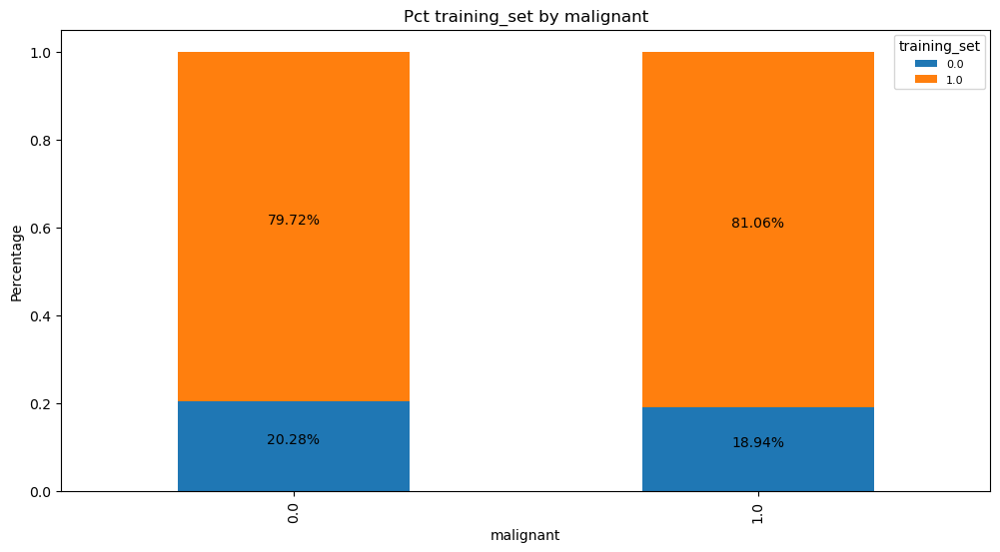

<Figure size 1200x600 with 0 Axes>

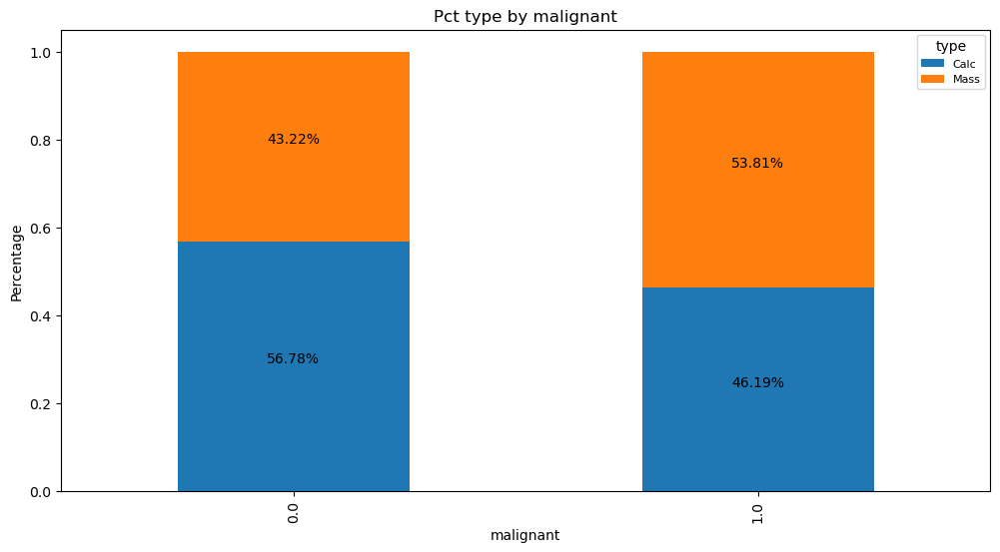

<Figure size 1200x600 with 0 Axes>

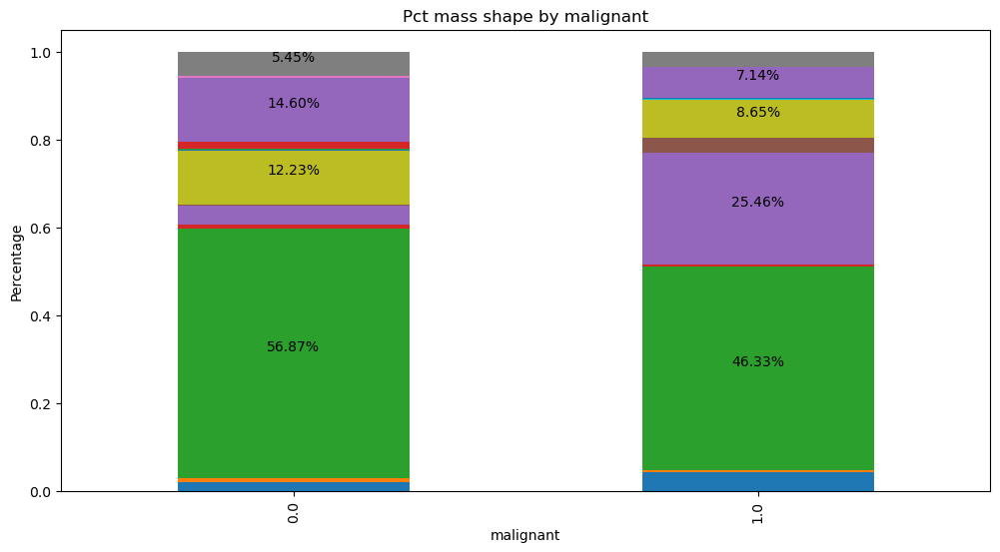

<Figure size 1200x600 with 0 Axes>

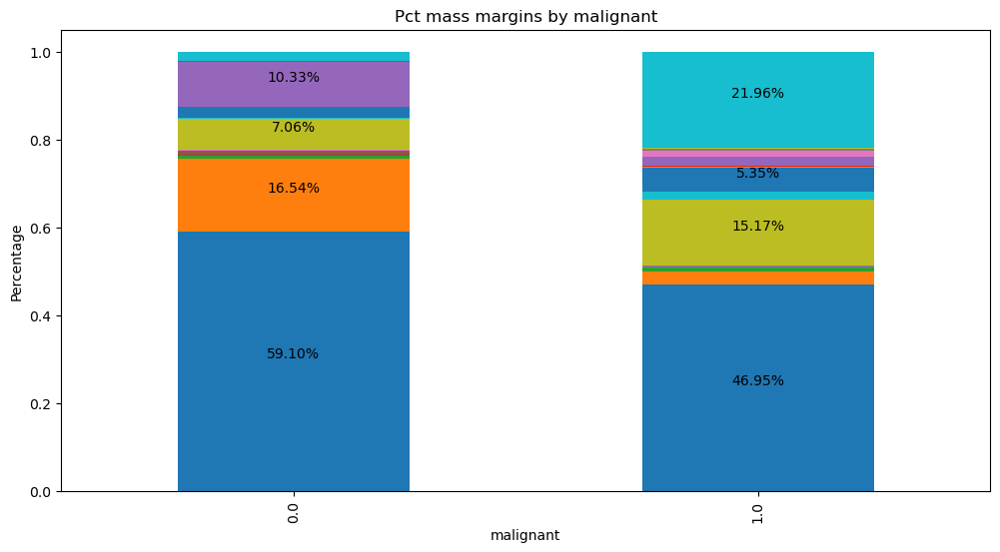

In [72]:
def get_pcts_by_malignant(df, var):
    _ = plt.figure(figsize=(12, 6))
    df = df.groupby('malignant')[var].value_counts(normalize=True).unstack()
    if len(df.columns) <= 10:
        ax = df.plot(kind='bar', stacked=True, figsize=(12, 6))
    else:
        ax = df.plot(kind='bar', stacked=True, figsize=(12, 6), legend=False)
        
    _ = plt.xlabel('malignant')
    _ = plt.ylabel('Percentage')
    _ = plt.title(f'Pct {var} by malignant')
    
    if len(df.columns) <= 10:
        _ = plt.legend(title=var, fontsize=8)
        
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        if height > .05:
            _ = ax.annotate(f'{height:.2%}', (x + width/2, y + height / 2), ha='center', va='bottom')

for var in images.columns.drop(['image_path', 'id', 'image_path_roi', 'image_path_combined', 'image_path_combined_resized',
                                'malignant']):
    get_pcts_by_malignant(images, var)

Observations about categorical features:

-The distributions of calc type and calc distribution are different between benign and malignant cases.

-The distribution of assessment is different between the two classes, as well, with a large percentage of malignant cases having an assessment of 5.

-The distribution of mass shape and mass margins is different between the two classes.

### Profile Report

In [73]:
images_profile_report = images.drop(['image_path', 'id', 'image_path_roi', 'image_path_combined', 
                                     'image_path_combined_resized'], axis=1)

In [74]:
profile = ProfileReport(images_profile_report, title="Final Dataset - Profiling Report")
profile.to_notebook_iframe()
profile.to_file("../reports/Final Dataset - Profiling Report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

A few observations can be made from the profile report:

-There are no missing values.

-Abnormality type, type, and pathology are all highly correlated with other features and can be dropped.

-Assessment, calc type, calc distribution, mass shape, and mass margins are the features most correlated with the target feature (malignant).

### Drop Redundant Columns

In [75]:
images = images.drop(['abnormality type', 'type', 'pathology', 'image_path', 'image_path_roi', 
                      'image_path_combined'], axis=1)
images.head()

,Laterality,id,PatientOrientation,abnormality id,breast density,calc type,calc distribution,assessment,subtlety,training_set,malignant,mass shape,mass margins,image_path_combined_resized
0,R,Mass-Training_P_01265_RIGHT_MLO_1,MLO,1,2,MASS,MASS,3,4,1.0,0.0,OVAL,CIRCUMSCRIBED,../data/processed/jpeg/Mass-Training_P_01265_R...
1,L,Calc-Test_P_00562_LEFT_CC_2,CC,2,2,LUCENT_CENTER,Unknown,2,4,0.0,0.0,CALCIFICATION,CALCIFICATION,../data/processed/jpeg/Calc-Test_P_00562_LEFT_...
2,R,Calc-Training_P_00181_RIGHT_CC_1,CC,1,4,PLEOMORPHIC,CLUSTERED,4,1,1.0,0.0,CALCIFICATION,CALCIFICATION,../data/processed/jpeg/Calc-Training_P_00181_R...
3,L,Calc-Training_P_01015_LEFT_CC_1,CC,1,2,PLEOMORPHIC,LINEAR,4,2,1.0,1.0,CALCIFICATION,CALCIFICATION,../data/processed/jpeg/Calc-Training_P_01015_L...
4,L,Calc-Training_P_01497_LEFT_CC_1,CC,1,4,PUNCTATE-AMORPHOUS,REGIONAL,4,3,1.0,0.0,CALCIFICATION,CALCIFICATION,../data/processed/jpeg/Calc-Training_P_01497_L...


# Get Image Data

In [76]:
metadata = images.copy()
training_data = images.loc[images.training_set==1].reset_index(drop=True)
testing_data = images.loc[images.training_set==0].reset_index(drop=True)

### Copy Training and Testing Data Into Separate Folders

In [77]:
training_data['training_folder'] = '../data/processed/jpeg/training/' + training_data['id']
testing_data['testing_folder'] = '../data/processed/jpeg/testing/' + testing_data['id']

def copy_file(row, output_folder):
    
    input_folder = row['image_path_combined_resized']
    output_folder = row[output_folder]
    
    os.makedirs(output_folder, exist_ok=True)
    
    shutil.copy(input_folder, output_folder)
    
_ = training_data.apply(lambda row: copy_file(row, 'training_folder'), axis=1)
_ = testing_data.apply(lambda row: copy_file(row, 'testing_folder'), axis=1)

### Training Data

#### Sort Labels

In [78]:
training_data_metadata = training_data.copy()
training_data_metadata = training_data_metadata.sort_values(['training_folder']).reset_index(drop=True)

#### Read Image Data

In [79]:
training_data_images = keras.utils.image_dataset_from_directory(
    '../data/processed/jpeg/training',
    labels=list(training_data_metadata['malignant']),
    label_mode='int',
    image_size=average_size
)

Found 2863 files belonging to 2 classes.


#### Check Class Names

In [80]:
training_data_images.class_names

[0.0, 1.0]

#### Look At Sample Batch Shapes and Sample of Data

In [81]:
for image_batch, labels_batch in training_data_images:
    print(image_batch.shape)
    print(labels_batch.shape)
    print(image_batch.numpy()[0])
    print(labels_batch.numpy()[0])
    break

(32, 423, 417, 3)
(32,)
[[[ 97.98561    97.98561    97.98561  ]
  [ 95.93525    95.93525    95.93525  ]
  [ 92.928055   92.928055   92.928055 ]
  ...
  [  9.07196     9.07196     9.07196  ]
  [  8.021606    8.021606    8.021606 ]
  [  7.007202    7.007202    7.007202 ]]

 [[ 97.00689    97.00689    97.00689  ]
  [ 94.97765    94.97765    94.97765  ]
  [ 92.928055   92.928055   92.928055 ]
  ...
  [  8.093237    8.093237    8.093237 ]
  [  8.00046     8.00046     8.00046  ]
  [  7.007202    7.007202    7.007202 ]]

 [[ 95.05653    95.05653    95.05653  ]
  [ 93.04858    93.04858    93.04858  ]
  [ 91.96352    91.96352    91.96352  ]
  ...
  [  9.001795    9.001795    9.001795 ]
  [  8.020841    8.020841    8.020841 ]
  [  7.9647946   7.9647946   7.9647946]]

 ...

 [[142.97173   142.97173   142.97173  ]
  [143.96454   143.96454   143.96454  ]
  [144.0005    144.0005    144.0005   ]
  ...
  [114.03343   114.03343   114.03343  ]
  [114.943695  114.943695  114.943695 ]
  [114.99975   114.9

### Testing Data

#### Sort Labels

In [82]:
testing_data_metadata = testing_data.copy()
testing_data_metadata = testing_data_metadata.sort_values(['testing_folder']).reset_index(drop=True)

#### Read Image Data

In [83]:
testing_data_images = keras.utils.image_dataset_from_directory(
    '../data/processed/jpeg/testing',
    labels=list(testing_data_metadata['malignant']),
    label_mode='int',
    image_size=average_size
)

Found 704 files belonging to 2 classes.


#### Check Class Names

In [84]:
testing_data_images.class_names

[0.0, 1.0]

#### Look At Sample Batch Shapes and Sample of Data

In [85]:
for image_batch, labels_batch in testing_data_images:
    print(image_batch.shape)
    print(labels_batch.shape)
    print(image_batch.numpy()[0])
    print(labels_batch.numpy()[0])
    break

(32, 423, 417, 3)
(32,)
[[[ 23.985611  23.985611  23.985611]
  [ 21.91367   21.91367   21.91367 ]
  [ 17.748201  17.748201  17.748201]
  ...
  [ 67.89206   67.89206   67.89206 ]
  [ 69.95679   69.95679   69.95679 ]
  [ 71.985596  71.985596  71.985596]]

 [[ 23.985611  23.985611  23.985611]
  [ 21.892546  21.892546  21.892546]
  [ 16.804684  16.804684  16.804684]
  ...
  [ 67.92728   67.92728   67.92728 ]
  [ 69.95679   69.95679   69.95679 ]
  [ 71.985596  71.985596  71.985596]]

 [[ 23.014133  23.014133  23.014133]
  [ 19.963009  19.963009  19.963009]
  [ 14.820398  14.820398  14.820398]
  ...
  [ 66.99821   66.99821   66.99821 ]
  [ 68.99225   68.99225   68.99225 ]
  [ 70.06346   70.06346   70.06346 ]]

 ...

 [[ 84.21328   84.21328   84.21328 ]
  [ 89.30604   89.30604   89.30604 ]
  [ 95.28318   95.28318   95.28318 ]
  ...
  [ 84.42403   84.42403   84.42403 ]
  [ 83.34152   83.34152   83.34152 ]
  [ 83.24874   83.24874   83.24874 ]]

 [[ 89.14233   89.14233   89.14233 ]
  [ 94.214264

### Save Final Datasets

In [86]:
training_data_metadata.to_csv('../data/processed/final_dataset_training_metadata.csv')
testing_data_metadata.to_csv('../data/processed/final_dataset_testing_metadata.csv')

os.makedirs('../data/processed/training', exist_ok=True)
tf.data.Dataset.save(training_data_images, '../data/processed/training')

os.makedirs('../data/processed/testing', exist_ok=True)
tf.data.Dataset.save(testing_data_images, '../data/processed/testing')

# Profiling Reports

### Breast Cancer Calcifications - Profiling Report

In [87]:
profile = ProfileReport(calc_case_description_profile_report.drop(['image file path', 'cropped image file path', 
                                                    'ROI mask file path', 'training_set'], axis=1), 
                        title="Breast Cancer Calcifications - Profiling Report")
profile.to_notebook_iframe()
profile.to_file("../reports/Breast Cancer Calcifications - Profiling Report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Breast Cancer Masses - Profiling Report

In [88]:
profile = ProfileReport(mass_case_description_profile_report.drop(['image file path', 'cropped image file path', 
                                                    'ROI mask file path', 'training_set'], axis=1), 
                        title="Breast Cancer Masses - Profiling Report")
profile.to_notebook_iframe()
profile.to_file("../reports/Breast Cancer Masses - Profiling Report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]